<a href="https://colab.research.google.com/github/yinghaow525/MSBA-Projects/blob/main/Capstone%20Project/Capstone_A6_final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Capsone Project with Spinnaker Analytics
Team A6: Yihan Jia, Yinghao Wang, Simeng Li, Xiangshan Mu, Kaiyu Wang
> **Business Objectives**:
- The objective of the exercise is to find a tradable signal in the dataset. 

> **Project Flow**:
- Standard time series models can be used or non-parametric models like neural networks can be deployed. Suggested course of actions is as follows:
  1. Understand the dataset and what it represents
  2. Define the problem: what does 'a tradable signal' mean based on the data available (i.e. develop your modeling equation, if any)
  3. Start with simple analysis to identify patterns and outliers
  4. Develop models with increasing complexity - i.e. don't start with neural nets etc
  5. Define your success criteria - i.e. when do you know you have a tradable signal - positive (buy)/negative (sell), both are signals


# Library Imports

In [86]:
# installs 
%%capture
!pip install statsmodels --upgrade

In [2]:
# imports
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import datetime as dt

from google.colab import drive

from statsmodels.tsa.stattools import adfuller

from statsmodels.tsa.api import ExponentialSmoothing

from statsmodels.graphics.tsaplots import plot_pacf, plot_acf

from statsmodels.tsa.arima_model import ARMA


#reset recursionlimit
import sys
sys.setrecursionlimit(10000)

# supress filter warnings
import warnings
warnings.filterwarnings("ignore")

#plt style
plt.style.use("seaborn")

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


# Data Source

The dataset contains sectoral data for 3 separate types of investments made in the US  (no international funds are included) and represents 60-70% of activity in the overall asset classes for that week (not all investors report data at the same time). The weekly data spans 10 years from 2006 through end-Jan 2017. Not all sectors have data available for all the dates since new investment vehicles are introduced at various points in time. 
1. **Institutional Mutual Fund Holdings** (investments made/redeemed by institutional investors like Fidelity, Vanguard on behalf of insitutions like CALPERS etc)
2. **Retail Mutual Fund Holdings** (investments made by individuals in their portfolios) 
3. **Exchange Traded Funds** - insitutional investors


## Data fields & descriptions:
- `ReportDate`: Weekly data aggregated and released every Wednesday	
- `AssetClass`: Industry/Sector/Asset Class	
- `Flow`: Amount of positive (inflow) or negative (outflow) in Millions of USD 	
- `FlowPct`: Flows as percent of assets at beginning of the week 	
- `AssetsEnd`: Assets at end of the week in Millions of USD	
- `PortfolioChangePct`: Percent change in overall portfolio during the week

## Data Imports

In [87]:
# read datasets
try:
  # mount my google drive
  drive.mount('/content/drive')
  # change directory to the path that contains dataset uploaded
  %cd /content/drive/My Drive/Capstone Project

  # read through google drive
  IMF = pd.read_csv('US Sector Inst ETF.csv')
  ETF = pd.read_csv('US Sector Inst ETF.csv')
  RMF  = pd.read_csv('US Sector Retail MF.csv')

except: 
  # or read through github
  ETF = pd.read_csv('https://raw.githubusercontent.com/yinghaow525/MSBA-Projects/main/Capstone%20Project/Datasets/US%20Sector%20Inst%20ETF.csv')
  IMF = pd.read_csv('https://raw.githubusercontent.com/yinghaow525/MSBA-Projects/main/Capstone%20Project/Datasets/US%20Sector%20Institutional%20MF.csv')
  RMF = pd.read_csv('https://raw.githubusercontent.com/yinghaow525/MSBA-Projects/main/Capstone%20Project/Datasets/US%20Sector%20Retail%20MF.csv')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/My Drive/Capstone Project


In [7]:
print(IMF.head(3))
print('-'*50)
print(ETF.head(3))
print('-'*50)
print(RMF.head(3))

             ReportDate                                         AssetClass  \
0  2/1/2017 12:00:00 AM  Commodities/Materials-North America-USA-North ...   
1  2/1/2017 12:00:00 AM  Consumer Goods-North America-USA-North America...   
2  2/1/2017 12:00:00 AM      Energy-North America-USA-North America-Equity   

         Flow  FlowPct     AssetsEnd  PortfolioChangePct  
0  378.578706   4.5064   8679.056347             -1.1938  
1  332.526792   1.1479  28973.613065             -1.1231  
2  186.031374   0.3782  48446.700077             -1.8855  
--------------------------------------------------
             ReportDate                                         AssetClass  \
0  2/1/2017 12:00:00 AM  Commodities/Materials-North America-USA-North ...   
1  2/1/2017 12:00:00 AM  Consumer Goods-North America-USA-North America...   
2  2/1/2017 12:00:00 AM      Energy-North America-USA-North America-Equity   

         Flow  FlowPct     AssetsEnd  PortfolioChangePct  
0  378.578706   4.5064   867

# Concating & Preprocessing

In [8]:
# Create type colunm
ETF['Type'] = 'ETF'
IMF['Type'] = 'IMF'
RMF['Type'] = 'RMF'

# Concat 3 dadaset
data = pd.concat([ETF, IMF, RMF], axis=0)

In [9]:
# check NAs
print(data.isna().sum())

ReportDate            0
AssetClass            0
Flow                  0
FlowPct               0
AssetsEnd             0
PortfolioChangePct    0
Type                  0
dtype: int64


In [10]:
# check duplicates
data.duplicated().sum()

0

In [11]:
# convert report date to pandas datetime object
data['ReportDate'] = pd.to_datetime(data['ReportDate'])

In [12]:
# since all the Asset and Sector values are the same (Equity, and within US)
# we only keep Industry sector as features
data['AssetClass'] = data['AssetClass'].str.split('-')
data['Industry'] = data.AssetClass.apply(lambda x: x[0])

# drop orignal AssetClass feature
data.drop(columns='AssetClass', inplace=True)

# types and number of Industry values
data.Industry.value_counts()

Mid Cap Growth           1737
Technology               1737
Energy                   1737
Financials               1737
Health Care/Biotech      1737
Utilities                1737
Large Cap Blend          1737
Large Cap Growth         1737
Large Cap Value          1737
Mid Cap Blend            1737
Telecom                  1737
Mid Cap Value            1737
Real Estate              1737
Small Cap Blend          1737
Small Cap Growth         1737
Small Cap Value          1737
Commodities/Materials    1700
Consumer Goods           1700
Industrials              1435
Infrastructure             47
Name: Industry, dtype: int64

In [13]:
# extract year & month 
data['year'], data['month'] = data['ReportDate'].dt.year, data['ReportDate'].dt.month
data.head()

,ReportDate,Flow,FlowPct,AssetsEnd,PortfolioChangePct,Type,Industry,year,month
0,2017-02-01,378.578706,4.5064,8679.056347,-1.1938,ETF,Commodities/Materials,2017,2
1,2017-02-01,332.526792,1.1479,28973.613065,-1.1231,ETF,Consumer Goods,2017,2
2,2017-02-01,186.031374,0.3782,48446.700077,-1.8855,ETF,Energy,2017,2
3,2017-02-01,968.885223,1.5139,64378.816729,-0.9202,ETF,Financials,2017,2
4,2017-02-01,410.686628,1.1532,36846.852743,2.3119,ETF,Health Care/Biotech,2017,2


# Exploratory Data Analysis & Statistical Analysis

## Discountinuity Check

We find four industies have less data records than others, these four industries are: `Commodities/Materials`, `Consumer Goods`, `Industrials`, and `Infrastructure`.

We want to understand the missing records in 2 ways:
1. whether certain type have less records than the others;
2. if so, we want to know where the record missing is: at the front of the timeline, at the back, in the middle or with not pattern.

### For `Commodities/Materials`:

In [14]:
# checking missing data for Commodities/Materials, and RMF type has less records
data.loc[data.Industry == 'Commodities/Materials'].Type.value_counts()

ETF    579
IMF    579
RMF    542
Name: Type, dtype: int64

In [15]:
# and we figure out that Commodities/Materials has missing RMF records at the beginning of entire timeline 
print('The most recent ReportDate for RMF type Commodities/Materials industry is {};'.format(data.loc[(data.Industry == 'Commodities/Materials') & 
                                                 (data.Type == 'RMF')].ReportDate.max()), '\n'
      'The least recent ReportDate for RMF type Commodities/Materials industry is {}.'.format(data.loc[(data.Industry == 'Commodities/Materials') & 
                                                 (data.Type == 'RMF')].ReportDate.min()),'\n'
      'Compare with other typed while same industry funds, their most recent ReportDate is {};'.format(data.loc[(data.Industry == 'Commodities/Materials') & 
                                                 (data.Type == 'IMF')].ReportDate.max()), '\n'
      'and their least recent ReportDate is {}.'.format(data.loc[(data.Industry == 'Commodities/Materials') & 
                                                 (data.Type == 'IMF')].ReportDate.min())
                                                 )

The most recent ReportDate for RMF type Commodities/Materials industry is 2017-02-01 00:00:00; 
The least recent ReportDate for RMF type Commodities/Materials industry is 2006-09-20 00:00:00. 
Compare with other typed while same industry funds, their most recent ReportDate is 2017-02-01 00:00:00; 
and their least recent ReportDate is 2006-01-04 00:00:00.


In [16]:
from datetime import datetime
def week_num(start_time, end_time):
  # week_start = datetime.strptime(start_time, '%Y-%m-%d')
  # week_end = datetime.strptime(end_time, '%Y-%m-%d')
  year_week_num = 52
  week_end_year = end_time.year
  week_start_year = start_time.year
  week_end_num = int(datetime.strftime(end_time, '%W'))
  week_start_num = int(datetime.strftime(start_time, '%W'))

  diff = (week_end_year - week_start_year) * year_week_num + week_end_num - week_start_num
  return diff

In [17]:
# calculate that different in weeks for two type's start time is equals to number of missing records
# no other missing data otherwise, no discontinuity exists
week_num(data.loc[(data.Industry == 'Commodities/Materials') & (data.Type == 'IMF')].ReportDate.min(), # start time
         data.loc[(data.Industry == 'Commodities/Materials') & (data.Type == 'RMF')].ReportDate.min(), # end time
)

37

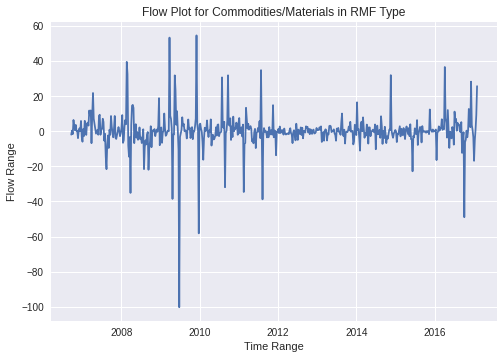

In [18]:
# Commodities/Materials Flow plot for 3 types:

# RMF type has a later start than the other two, and the range is smaller
plt.plot(data.loc[(data.Industry == 'Commodities/Materials') & 
                                                 (data.Type == 'RMF')].ReportDate, 
         data.loc[(data.Industry == 'Commodities/Materials') & 
                                                 (data.Type == 'RMF')].Flow,
         label = 'RMF')
plt.title('Flow Plot for Commodities/Materials in RMF Type')
plt.xlabel('Time Range')
plt.ylabel('Flow Range')
plt.show()

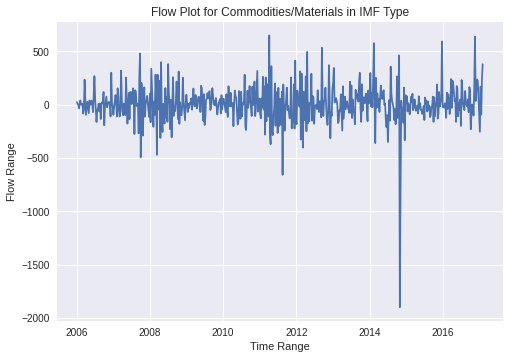

In [19]:
# IMF type generally stay within range -500 ~ 500, while has a large outflow reached about -2000 in 2014 May
plt.plot(data.loc[(data.Industry == 'Commodities/Materials') & 
                                                 (data.Type == 'IMF')].ReportDate, 
         data.loc[(data.Industry == 'Commodities/Materials') & 
                                                 (data.Type == 'IMF')].Flow,
         label = 'IMF')
plt.title('Flow Plot for Commodities/Materials in IMF Type')
plt.xlabel('Time Range')
plt.ylabel('Flow Range')
plt.show()

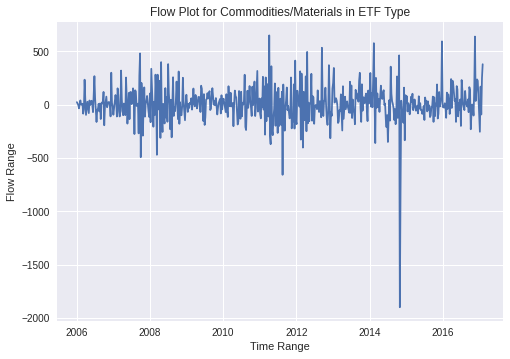

In [20]:
# RMF type is very similar to that of IMF
# the similarity exists in trend, and value amount of flow
plt.plot(data.loc[(data.Industry == 'Commodities/Materials') & 
                                                 (data.Type == 'ETF')].ReportDate, 
         data.loc[(data.Industry == 'Commodities/Materials') & 
                                                 (data.Type == 'ETF')].Flow,
         label = 'ETF')
plt.title('Flow Plot for Commodities/Materials in ETF Type')
plt.xlabel('Time Range')
plt.ylabel('Flow Range')
plt.show()

In [21]:
# flow amount for IMF
data.loc[(data.Industry == 'Commodities/Materials') & 
                                                 (data.Type == 'IMF')].Flow

0        378.578706
19       250.733560
38       -92.853355
57       168.711676
76      -254.535873
            ...    
10908      0.000000
10927    -34.945224
10946     -2.269946
10965     11.561203
10984     23.148567
Name: Flow, Length: 579, dtype: float64

In [22]:
# flow amount for ETF
data.loc[(data.Industry == 'Commodities/Materials') & 
                                                 (data.Type == 'ETF')].Flow

0        378.578706
19       250.733560
38       -92.853355
57       168.711676
76      -254.535873
            ...    
10908      0.000000
10927    -34.945224
10946     -2.269946
10965     11.561203
10984     23.148567
Name: Flow, Length: 579, dtype: float64

### For `Consumer Goods`:

In [23]:
# checking missing data for Comsumer Goods
# similarly, this industry also has less records in RMF type
data.loc[data.Industry == 'Consumer Goods'].Type.value_counts()

ETF    579
IMF    579
RMF    542
Name: Type, dtype: int64

In [24]:
# and we figure out that Consumer Goods has missing RMF records at the beginning of entire timeline 
print('The most recent ReportDate for RMF type Consumer Goods industry is {};'.format(data.loc[(data.Industry == 'Consumer Goods') & 
                                                 (data.Type == 'RMF')].ReportDate.max()), '\n'
      'The least recent ReportDate for RMF type Consumer Goods industry is {}.'.format(data.loc[(data.Industry == 'Consumer Goods') & 
                                                 (data.Type == 'RMF')].ReportDate.min()),'\n'
      'Compare with other typed while same industry funds, their most recent ReportDate is {};'.format(data.loc[(data.Industry == 'Consumer Goods') & 
                                                 (data.Type == 'IMF')].ReportDate.max()), '\n'
      'and their least recent ReportDate is {}.'.format(data.loc[(data.Industry == 'Consumer Goods') & 
                                                 (data.Type == 'IMF')].ReportDate.min())
                                                 )

The most recent ReportDate for RMF type Consumer Goods industry is 2017-02-01 00:00:00; 
The least recent ReportDate for RMF type Consumer Goods industry is 2006-09-20 00:00:00. 
Compare with other typed while same industry funds, their most recent ReportDate is 2017-02-01 00:00:00; 
and their least recent ReportDate is 2006-01-04 00:00:00.


In [25]:
# calculate that different in weeks for two type's start time is equals to number of missing records
# no other missing data otherwise, no discontinuity exists
week_num(data.loc[(data.Industry == 'Consumer Goods') & (data.Type == 'IMF')].ReportDate.min(), # start time
         data.loc[(data.Industry == 'Consumer Goods') & (data.Type == 'RMF')].ReportDate.min(), # end time
)

37

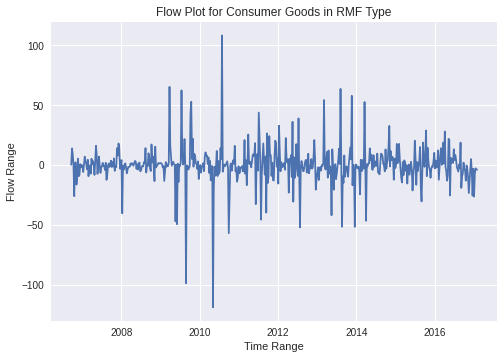

In [26]:
# Consumer Goods Flow plot for 3 types:

# RMF type has a later start than the other two, and the Flow range is smaller
plt.plot(data.loc[(data.Industry == 'Consumer Goods') & 
                                                 (data.Type == 'RMF')].ReportDate, 
         data.loc[(data.Industry == 'Consumer Goods') & 
                                                 (data.Type == 'RMF')].Flow,
         label = 'RMF')
plt.title('Flow Plot for Consumer Goods in RMF Type')
plt.xlabel('Time Range')
plt.ylabel('Flow Range')
plt.show()

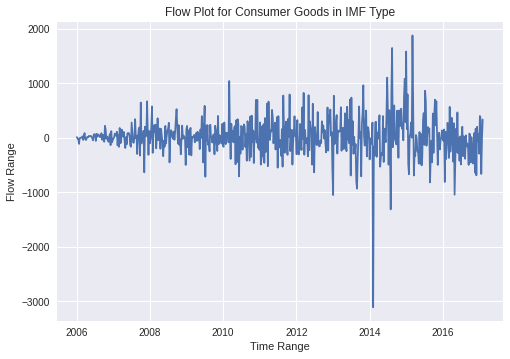

In [27]:
# most flow amount is within -800 ~ 1000 range, while there exists extreme drop in the beginning of 2014
plt.plot(data.loc[(data.Industry == 'Consumer Goods') & 
                                                 (data.Type == 'IMF')].ReportDate, 
         data.loc[(data.Industry == 'Consumer Goods') & 
                                                 (data.Type == 'IMF')].Flow,
         label = 'IMF')
plt.title('Flow Plot for Consumer Goods in IMF Type')
plt.xlabel('Time Range')
plt.ylabel('Flow Range')
plt.show()

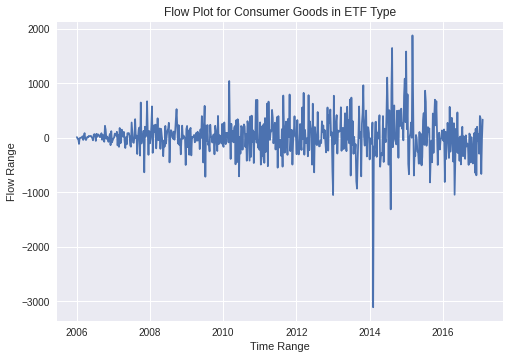

In [28]:
# this time, the RMF type is still very similar to IMF one
plt.plot(data.loc[(data.Industry == 'Consumer Goods') & 
                                                 (data.Type == 'ETF')].ReportDate, 
         data.loc[(data.Industry == 'Consumer Goods') & 
                                                 (data.Type == 'ETF')].Flow,
         label = 'ETF')
plt.title('Flow Plot for Consumer Goods in ETF Type')
plt.xlabel('Time Range')
plt.ylabel('Flow Range')
plt.show()

### For `Industrials`:

In [29]:
# checking missing data for Industrials
# similarly, this industry also has less records in RMF type
data.loc[data.Industry == 'Industrials'].Type.value_counts()

ETF    579
IMF    579
RMF    277
Name: Type, dtype: int64

In [30]:
# and we figure out that Industrials has missing RMF records at the beginning of entire timeline 
print('The most recent ReportDate for RMF type Industrials industry is {};'.format(data.loc[(data.Industry == 'Industrials') & 
                                                 (data.Type == 'RMF')].ReportDate.max()), '\n'
      'The least recent ReportDate for RMF type Industrials industry is {}.'.format(data.loc[(data.Industry == 'Industrials') & 
                                                 (data.Type == 'RMF')].ReportDate.min()),'\n'
      'Compare with other typed while same industry funds, their most recent ReportDate is {};'.format(data.loc[(data.Industry == 'Industrials') & 
                                                 (data.Type == 'IMF')].ReportDate.max()), '\n'
      'and their least recent ReportDate is {}.'.format(data.loc[(data.Industry == 'Industrials') & 
                                                 (data.Type == 'IMF')].ReportDate.min())
                                                 )

The most recent ReportDate for RMF type Industrials industry is 2017-02-01 00:00:00; 
The least recent ReportDate for RMF type Industrials industry is 2011-10-19 00:00:00. 
Compare with other typed while same industry funds, their most recent ReportDate is 2017-02-01 00:00:00; 
and their least recent ReportDate is 2006-01-04 00:00:00.


In [31]:
# calculate that different in weeks for two type's start time is equals to number of missing records
# no other missing data otherwise, no discontinuity exists 
week_num(data.loc[(data.Industry == 'Industrials') & (data.Type == 'IMF')].ReportDate.min(), # start time
         data.loc[(data.Industry == 'Industrials') & (data.Type == 'RMF')].ReportDate.min(), # end time
)

301

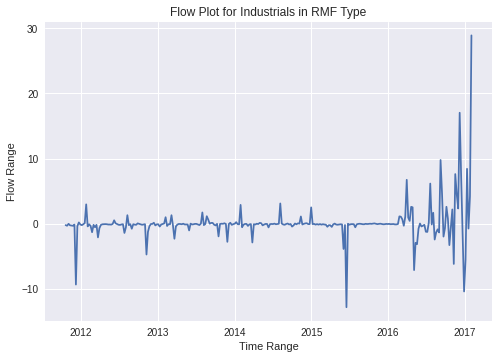

In [32]:
# Industrials plot for 3 types:

# RMF type has a much later start than the other two, and the Flow range is smaller
plt.plot(data.loc[(data.Industry == 'Industrials') & 
                                                 (data.Type == 'RMF')].ReportDate, 
         data.loc[(data.Industry == 'Industrials') & 
                                                 (data.Type == 'RMF')].Flow,
         label = 'RMF')
plt.title('Flow Plot for Industrials in RMF Type')
plt.xlabel('Time Range')
plt.ylabel('Flow Range')
plt.show()

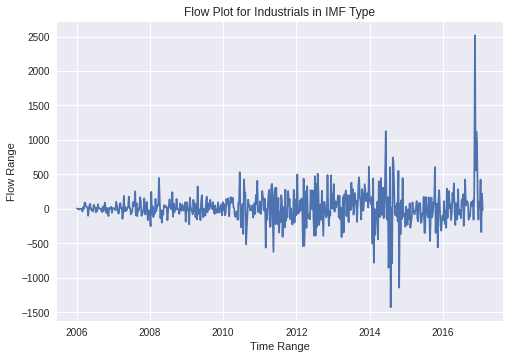

In [33]:
# most flow amount is within -500 ~ 500 range, while there exists extreme drop in 2014
# and extreme rise in 2017
plt.plot(data.loc[(data.Industry == 'Industrials') & 
                                                 (data.Type == 'IMF')].ReportDate, 
         data.loc[(data.Industry == 'Industrials') & 
                                                 (data.Type == 'IMF')].Flow,
         label = 'IMF')
plt.title('Flow Plot for Industrials in IMF Type')
plt.xlabel('Time Range')
plt.ylabel('Flow Range')
plt.show()

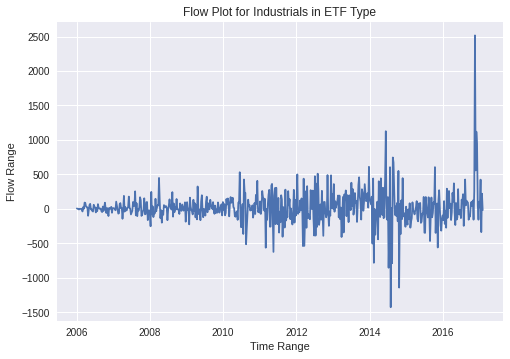

In [34]:
# this time, the RMF type is not similar to IMF one,
# the trend is very unstable, very frequent rises and drops during the timeline
plt.plot(data.loc[(data.Industry == 'Industrials') & 
                                                 (data.Type == 'ETF')].ReportDate, 
         data.loc[(data.Industry == 'Industrials') & 
                                                 (data.Type == 'ETF')].Flow,
         label = 'ETF')
plt.title('Flow Plot for Industrials in ETF Type')
plt.xlabel('Time Range')
plt.ylabel('Flow Range')
plt.show()

### For `Infrastructure`:

In [35]:
# checking missing data for Infrastructure
# this industry has too few records for visualization
data.loc[data.Industry == 'Infrastructure'].Type.value_counts()

RMF    43
ETF     2
IMF     2
Name: Type, dtype: int64

In [36]:
# and we figure out that Industrials has missing RMF records at the beginning of entire timeline 
print('The most recent ReportDate for RMF type Industrials industry is {};'.format(data.loc[(data.Industry == 'Infrastructure') & 
                                                 (data.Type == 'RMF')].ReportDate.max()), '\n'
      'The least recent ReportDate for RMF type Industrials industry is {}.'.format(data.loc[(data.Industry == 'Infrastructure') & 
                                                 (data.Type == 'RMF')].ReportDate.min()),'\n'
      'Compare with IMF type while same industry funds, their most recent ReportDate is {};'.format(data.loc[(data.Industry == 'Infrastructure') & 
                                                 (data.Type == 'IMF')].ReportDate.max()), '\n'
      'and their least recent ReportDate is {}.'.format(data.loc[(data.Industry == 'Infrastructure') & 
                                                 (data.Type == 'IMF')].ReportDate.min()), '\n'
       'Compare with ETF type while same industry funds, their most recent ReportDate is {};'.format(data.loc[(data.Industry == 'Infrastructure') & 
                                                 (data.Type == 'ETF')].ReportDate.max()), '\n'
      'and their least recent ReportDate is {}.'.format(data.loc[(data.Industry == 'Infrastructure') & 
                                                 (data.Type == 'ETF')].ReportDate.min())
                                                 )

The most recent ReportDate for RMF type Industrials industry is 2017-02-01 00:00:00; 
The least recent ReportDate for RMF type Industrials industry is 2016-04-13 00:00:00. 
Compare with IMF type while same industry funds, their most recent ReportDate is 2014-10-08 00:00:00; 
and their least recent ReportDate is 2014-10-01 00:00:00. 
Compare with ETF type while same industry funds, their most recent ReportDate is 2014-10-08 00:00:00; 
and their least recent ReportDate is 2014-10-01 00:00:00.


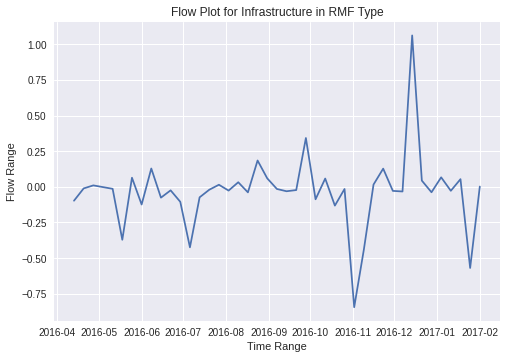

In [37]:
# Infrastructure plot for 3 types:

# RMF has less than 1 year records
plt.plot(data.loc[(data.Industry == 'Infrastructure') & 
                                                 (data.Type == 'RMF')].ReportDate, 
         data.loc[(data.Industry == 'Infrastructure') & 
                                                 (data.Type == 'RMF')].Flow,
         label = 'RMF')
plt.title('Flow Plot for Infrastructure in RMF Type')
plt.xlabel('Time Range')
plt.ylabel('Flow Range')
plt.show()

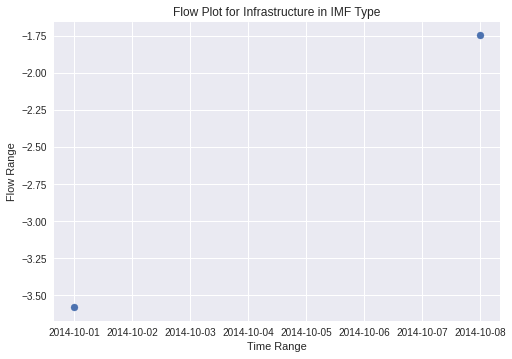

In [38]:
# IMF has only 4 week records
# and the data exists time-line discountinuity
plt.scatter(x=data.loc[(data.Industry == 'Infrastructure') & 
                                                 (data.Type == 'IMF')].ReportDate, 
         y=data.loc[(data.Industry == 'Infrastructure') & 
                                                 (data.Type == 'IMF')].Flow,
         label = 'IMF')
plt.title('Flow Plot for Infrastructure in IMF Type')
plt.xlabel('Time Range')
plt.ylabel('Flow Range')
plt.show()

## ----------
2. Exploritory Data Analysis

In [39]:
# max & min value for Flow
print('Max value of Flow is {};'.format(data.Flow.max()), '\n'
      'Min value of Flow is {};'.format(data.Flow.min()),'\n'
      'Avg value of Flow is {}.'.format(data.Flow.mean()))

Max value of Flow is 22682.167440425; 
Min value of Flow is -13821.7273968; 
Avg value of Flow is 26.146966697180474.


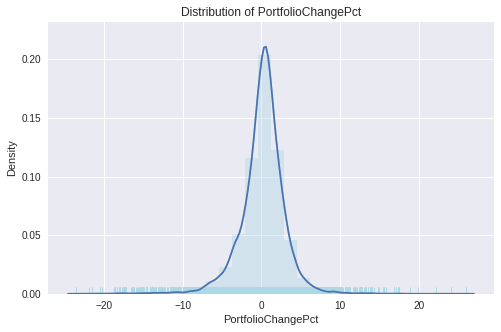

In [40]:
# distribution of entire PortfolioChangePct
plt.figure(figsize=(8,5))
sns.distplot(data.PortfolioChangePct, color='lightblue', bins=30, rug=True)
sns.distplot(data.PortfolioChangePct, hist=False)
plt.title("Distribution of PortfolioChangePct")
plt.show()

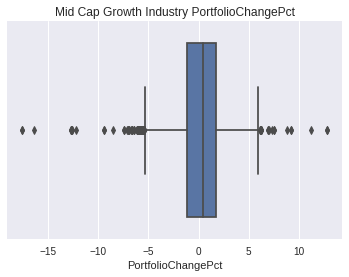

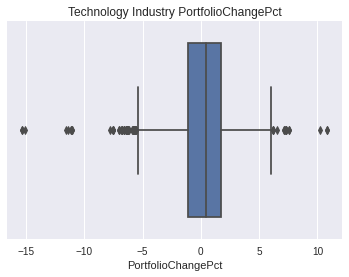

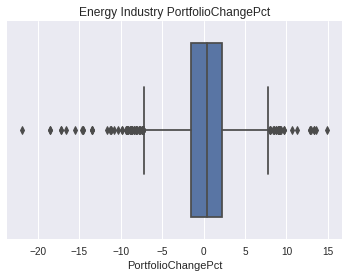

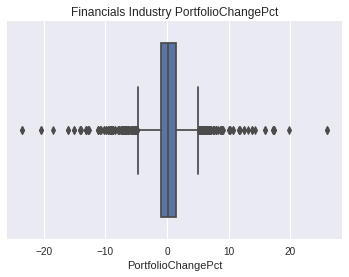

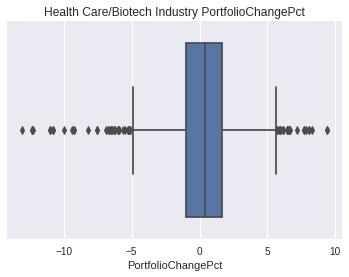

...

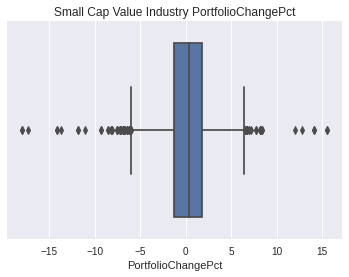

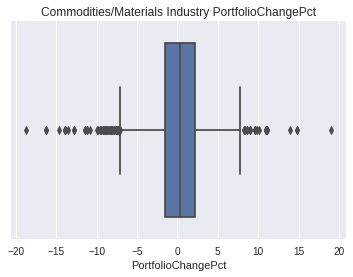

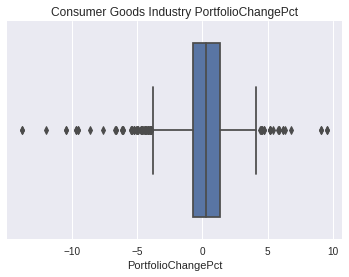

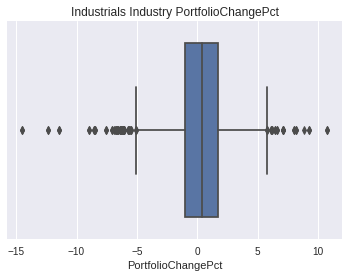

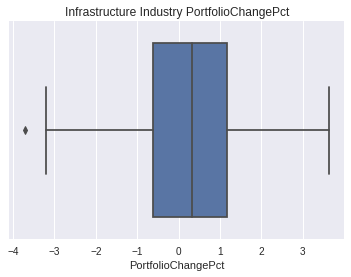

In [41]:
# plotting PortfolioChangePct distribution by industry on boxplot, we can do via a loop
for _ in data.Industry.value_counts().index:
  plt.figure(figsize=(6,4))
  sns.boxplot(data.loc[data.Industry == _].PortfolioChangePct)
  plt.title(_+' Industry PortfolioChangePct')
  plt.show()

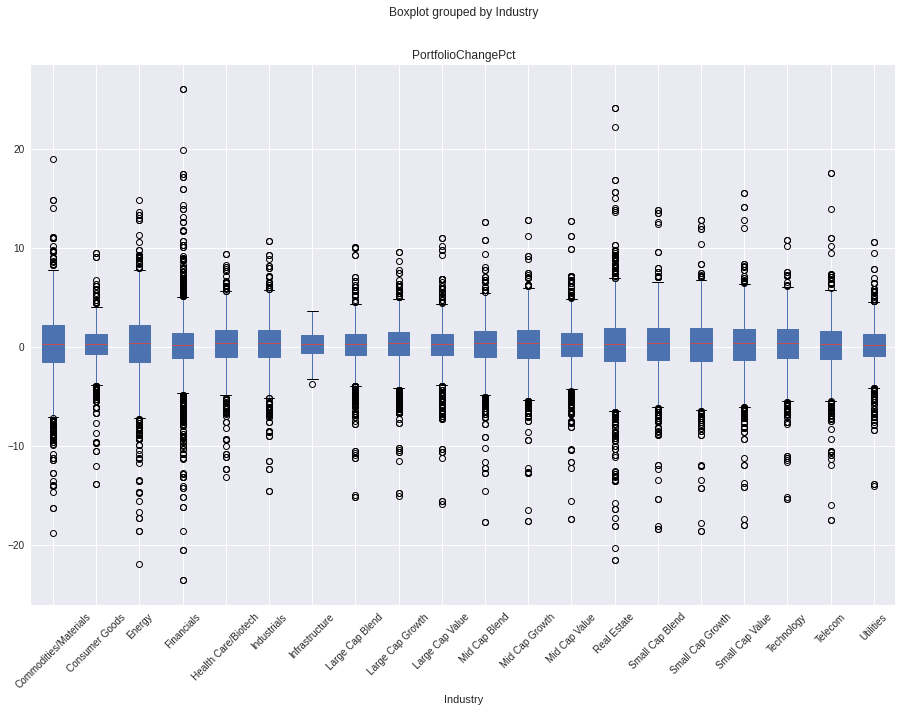

In [42]:
  # ... or agg into a single plot
  data.boxplot(column = 'PortfolioChangePct', by = 'Industry', figsize=(15,10), 
               rot = 45, fontsize = 10, patch_artist = True)
  plt.show()


  ###  outliers: >= |15| ??? 

In [43]:
# group by education
groupby_type = data.groupby('Type').mean()
groupby_type.reset_index(inplace=True)
groupby_type

,Type,Flow,FlowPct,AssetsEnd,PortfolioChangePct,year,month
0,ETF,62.592954,0.266612,30641.955796,0.172921,2011.052349,6.485958
1,IMF,62.592954,0.266612,30641.955796,0.172921,2011.052349,6.485958
2,RMF,-49.033985,0.381269,46085.848006,0.148504,2011.182133,6.503562


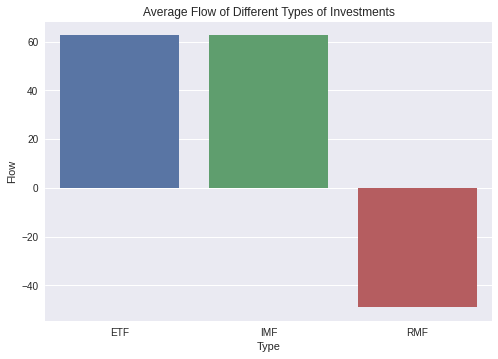

In [44]:
sns.barplot(groupby_type.Type,groupby_type.Flow, data=groupby_type)
plt.title('Average Flow of Different Types of Investments')
plt.show()

In [45]:
groupby_month = data.groupby('month').mean()
groupby_month.reset_index(inplace=True)
groupby_month

,month,Flow,FlowPct,AssetsEnd,PortfolioChangePct,year
0,1,-28.437488,0.087668,35886.301614,-0.111699,2011.472052
1,2,-35.089360,0.408939,33991.424380,0.173612,2011.194905
2,3,44.592485,0.658852,34209.109411,0.589197,2011.021860
3,4,-17.146065,0.477698,35421.831881,0.649499,2011.086506
4,5,-21.461209,0.053647,34880.615743,-0.193738,2010.924926
5,6,41.344766,0.142630,35425.822424,-0.223505,2011.133585
6,7,48.365851,0.403723,36132.184014,0.493006,2011.127760
7,8,0.222286,0.218966,35523.176564,-0.150612,2010.990221
8,9,62.576866,0.439938,35772.933989,0.144418,2011.060309
9,10,12.957989,0.021972,35946.017082,-0.105013,2011.015124


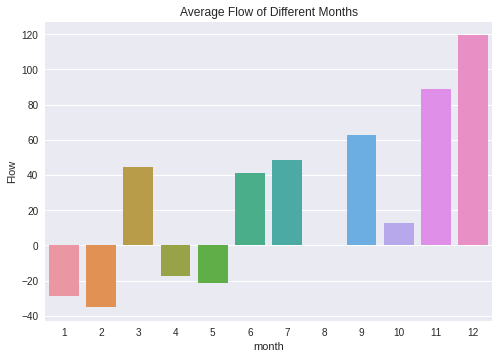

In [46]:
sns.barplot(groupby_month.month,groupby_month.Flow, data=groupby_month)
plt.title('Average Flow of Different Months')
plt.show()

# Time Series Analysis

Local Optimization

Here we generate 3 (MA, SES & LSTM) models for each of 48 unique combination of fund type and fund industry, we aim at minimizing mse and reach a relatively high accuracy on predicting the tradable signal in terms of flow amount.

Among the four models, MA and SES estimations are simple to understand, fast to execute and return with relatively more accurate prediction results.

In [47]:
# drop all rows where industry == Infrastructure
df = data.drop(data[data['Industry'] == 'Infrastructure'].index)

In [48]:
data.Type.unique()

array(['ETF', 'IMF', 'RMF'], dtype=object)

In [49]:
data.Industry.unique()

array(['Commodities/Materials', 'Consumer Goods', 'Energy', 'Financials',
       'Health Care/Biotech', 'Industrials', 'Large Cap Blend',
       'Large Cap Growth', 'Large Cap Value', 'Mid Cap Blend',
       'Mid Cap Growth', 'Mid Cap Value', 'Real Estate',
       'Small Cap Blend', 'Small Cap Growth', 'Small Cap Value',
       'Technology', 'Telecom', 'Utilities', 'Infrastructure'],
      dtype=object)

In [50]:
# exclude industries with missing data observations
industries = ['Energy', 'Financials',
       'Health Care/Biotech', 'Large Cap Blend',
       'Large Cap Growth', 'Large Cap Value', 'Mid Cap Blend',
       'Mid Cap Growth', 'Mid Cap Value', 'Real Estate',
       'Small Cap Blend', 'Small Cap Growth', 'Small Cap Value',
       'Technology', 'Telecom', 'Utilities']

In [51]:
len(industries)

16

## Stationary Check

All subsets of flow (with different types and industries) are tested to be stastionary.

In [52]:
#Ho: It is non-stationary
#H1: It is stationary

# self define func
def adfuller_test(flow):
    result = adfuller(flow)
    labels = ['ADF Test Statistic','p-value','#Lags Used','Number of Observations']
    for value,label in zip(result,labels):
        print(label+' : '+str(value) )

    if result[1] <= 0.05:
      print("Strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data is stationary.")
    else:
      print("weak evidence against null hypothesis,indicating it is non-stationary.")

In [53]:
# all sub flows are stationary
for t in data.Type.unique():
  # iterating for 16 industries 
  for i in industries:
    print('Stationary check for type {} in {} industry:'.format(t, i))
    temp = data.loc[(data.Type == t) & (data.Industry == i)][['ReportDate', 'Flow']]
    temp_test = temp['Flow']
    adfuller_test(temp_test)
    print('-'*50)

Stationary check for type ETF in Energy industry:
ADF Test Statistic : -21.07813363393672
p-value : 0.0
#Lags Used : 1
Number of Observations : 577
Strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data is stationary.
--------------------------------------------------
Stationary check for type ETF in Financials industry:
ADF Test Statistic : -7.130444759126436
p-value : 3.529128253702001e-10
#Lags Used : 18
Number of Observations : 560
Strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data is stationary.
--------------------------------------------------
Stationary check for type ETF in Health Care/Biotech industry:
ADF Test Statistic : -4.133572223520001
p-value : 0.0008519063114161399
#Lags Used : 19
Number of Observations : 559
Strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data is stationary.
--------------------------------------------------
Stationary check for type ETF in Large Cap Blend industry

##  Moving Average

In [54]:
from sklearn.metrics import mean_squared_error

In [55]:
# initialize empty dataframe to store moving avgerage estimation results
df_ma = pd.DataFrame()

In [56]:
# iterating for 3 types
for t in data.Type.unique():
  # iterating for 16 industries 
  for i in industries:
    # ma window
    for n in range(1, 21):
      sub = data.loc[(data.Type == t) & (data.Industry == i)][['ReportDate', 'Flow']]
      # no burn-in period assumed, predict the last 28 observations
      mse = mean_squared_error(sub["Flow"][550:], sub["Flow"].rolling(n).mean()[549:578])
      df_ma = df_ma.append({'Type': t,
                            'Industry': i,
                            'MA window': n,
                            'MA_mse': mse}, ignore_index = True
                           )
      # print('With window = {}, the corresponding mse in {} Industry with {} Type is {}.'.format(n, i, t, mse))

In [57]:
# groupby mse values by Type and Industries, and sort values by mse
df_ma = df_ma.groupby(['Type','Industry']).apply(lambda x: x.sort_values(["MA_mse"], ascending = True)).reset_index(drop=True)

In [58]:
# store best result
df_ma_final = pd.DataFrame()

for i in range(0, 960, 20):
  df_ma_final = df_ma_final.append(df_ma.iloc[i])

In [59]:
# reset index
df_ma_final.reset_index(inplace=True)
# remove first column
df_ma_final = df_ma_final.iloc[:, 1:]
# ma window as int
df_ma_final['MA window'] = df_ma_final['MA window'].astype('int')

df_ma_final

,Type,Industry,MA window,MA_mse
0,ETF,Energy,13,1.683463e+05
1,ETF,Financials,11,5.298055e+04
2,ETF,Health Care/Biotech,14,1.037090e+04
3,ETF,Large Cap Blend,20,3.255064e+06
4,ETF,Large Cap Growth,20,1.427495e+05
5,ETF,Large Cap Value,17,1.565841e+05
6,ETF,Mid Cap Blend,20,3.422931e+04
7,ETF,Mid Cap Growth,6,1.773055e+03
8,ETF,Mid Cap Value,9,2.273634e+04
9,ETF,Real Estate,18,4.950357e+04


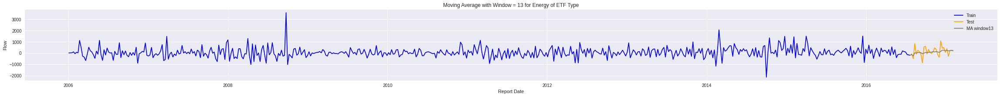

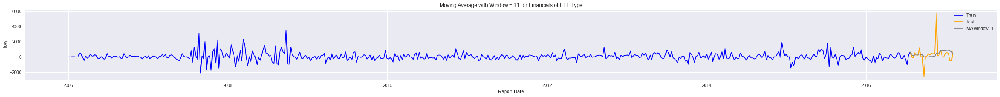

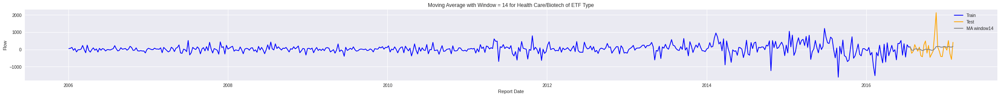

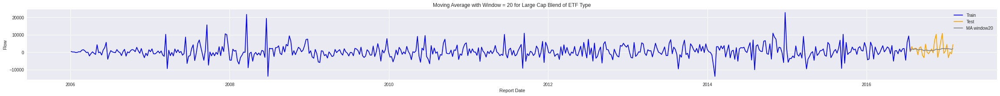

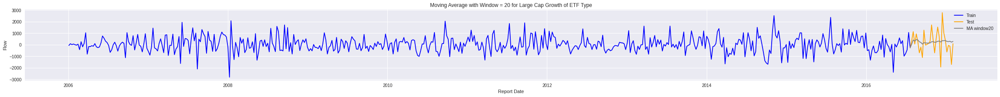

...

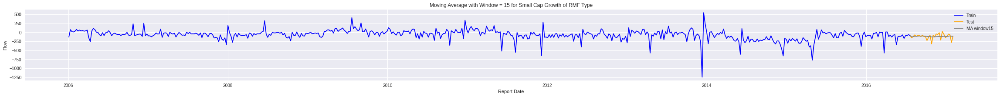

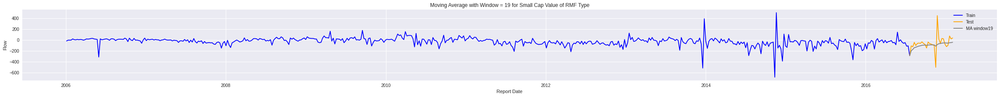

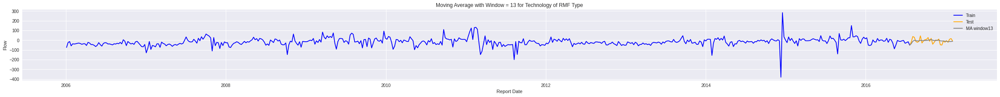

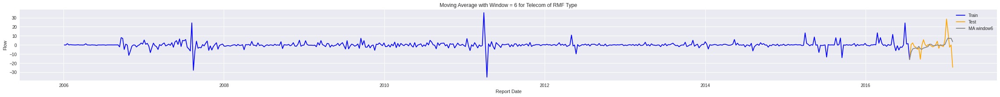

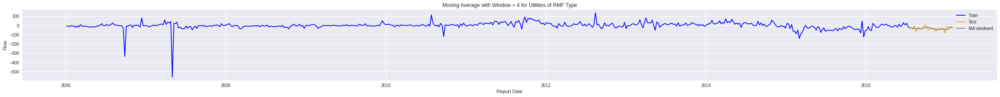

In [60]:
# iterating for flow & MA window saved in above dataframe
for i in range(df_ma_final.shape[0]):
  # subset 
  sub = data.loc[(data.Type == df_ma_final.iloc[i].Type) & (data.Industry == df_ma_final.iloc[i].Industry)][['ReportDate', 'Flow']]
  # reorder sequence
  sub.sort_values('ReportDate', ascending  = True, inplace=True)
  # train & test split
  train = sub.iloc[:551]
  test = sub.iloc[550:]
  # predict with best ma window
  pred_ma = test.Flow.rolling(df_ma_final.iloc[i]['MA window'], min_periods = 1).mean()
  # plot
  plt.figure(figsize=(40,3))
  plt.plot(train.ReportDate, train.Flow, c = 'b', label = 'Train')
  plt.plot(test.ReportDate, test.Flow, c = 'orange', label = 'Test')
  ma_window = "MA window" + str(df_ma_final.iloc[i]['MA window'])
  plt.plot(test.ReportDate, pred_ma, c = 'grey', label = ma_window)
  plt.title('Moving Average with Window = {} for {} of {} Type'.format(df_ma_final.iloc[i]['MA window'], df_ma_final.iloc[i]['Industry'], df_ma_final.iloc[i]['Type']))
  plt.xlabel('Report Date')
  plt.ylabel('Flow')
  plt.legend()
  plt.show()

In [61]:
# if needed to store output
# df_ma_final.to_csv('moving_avg_output.csv')

-------

## Simple Exponential Smoothing

In [62]:
df_ses = pd.DataFrame()

In [63]:
# iterating for 3 types
for t in data.Type.unique():
  # iterating for 16 industries 
  for i in industries:
    # ma window
    sub = data.loc[(data.Type == t) & (data.Industry == i)][['ReportDate', 'Flow']]
    for alpha in np.arange(0.1, 1.1, 0.1):
      # calculating mse
      mse = mean_squared_error(sub.Flow[550:],ExponentialSmoothing(sub.Flow).fit(smoothing_level = alpha).predict(550,))

      df_ses = df_ses.append({'Type': t,
                            'Industry': i,
                            'SES alpha': alpha,
                            'SES mse': mse}, ignore_index = True
                           )

In [64]:
df_ses

,Type,Industry,SES alpha,SES mse
0,ETF,Energy,0.1,181055.909260
1,ETF,Energy,0.2,196442.184190
2,ETF,Energy,0.3,211393.780202
3,ETF,Energy,0.4,225551.850059
4,ETF,Energy,0.5,238887.927022
...,...,...,...,...
475,RMF,Utilities,0.6,78.594105
476,RMF,Utilities,0.7,82.907386
477,RMF,Utilities,0.8,88.519743
478,RMF,Utilities,0.9,95.753710


In [65]:
# groupby mse values by Type and Industries, and sort values by mse
df_ses = df_ses.groupby(['Type','Industry']).apply(lambda x: x.sort_values(["SES mse"], ascending = True)).reset_index(drop=True)

In [66]:
# store best result
df_ses_final = pd.DataFrame()

for i in range(0, 480, 10):
  df_ses_final = df_ses_final.append(df_ses.iloc[i])

In [67]:
df_ses_final.reset_index(inplace=True)
df_ses_final = df_ses_final.iloc[:, 1:]
df_ses_final

,Type,Industry,SES alpha,SES mse
0,ETF,Energy,0.1,1.810559e+05
1,ETF,Financials,0.1,5.545442e+04
2,ETF,Health Care/Biotech,0.1,1.063216e+04
3,ETF,Large Cap Blend,0.1,3.374319e+06
4,ETF,Large Cap Growth,0.1,1.492183e+05
5,ETF,Large Cap Value,0.1,1.608566e+05
6,ETF,Mid Cap Blend,0.1,3.649100e+04
7,ETF,Mid Cap Growth,0.2,1.829638e+03
8,ETF,Mid Cap Value,0.1,2.339144e+04
9,ETF,Real Estate,0.1,5.241447e+04


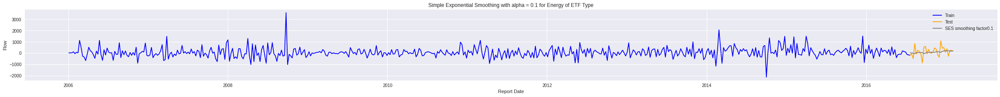

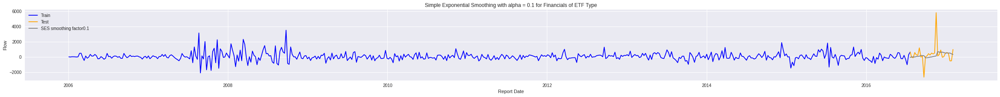

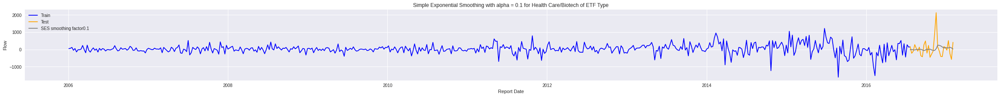

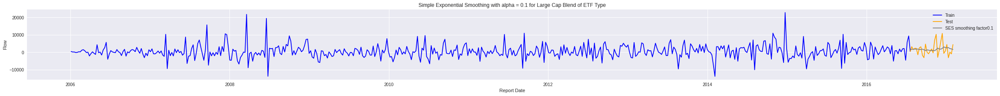

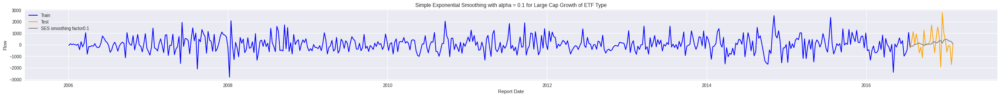

...

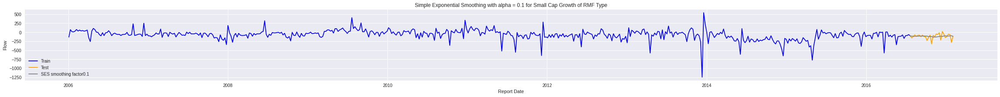

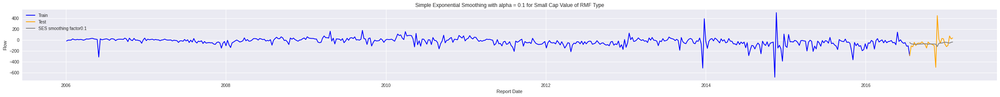

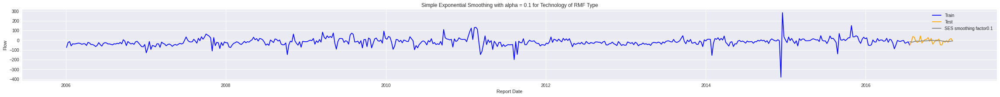

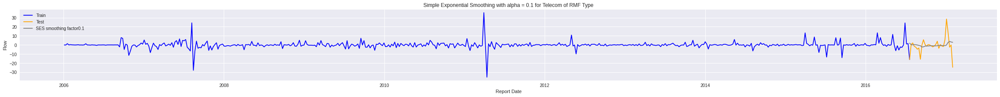

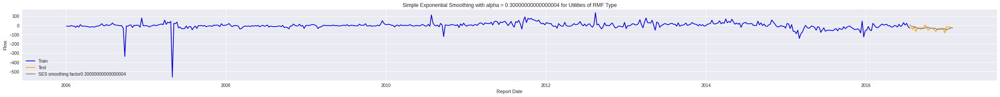

In [68]:
# iterating for flow & SES smoothing factor saved in above dataframe
for i in range(df_ses_final.shape[0]):
  # subset 
  sub = data.loc[(data.Type == df_ses_final.iloc[i].Type) & (data.Industry == df_ses_final.iloc[i].Industry)][['ReportDate', 'Flow']]
  # reorder sequence
  sub.sort_values('ReportDate', ascending  = True, inplace=True)
  # train & test split
  train = sub.iloc[:551]
  test = sub.iloc[550:]
  # predict with best ses alpha
  pred_ses = ExponentialSmoothing(sub.Flow).fit(smoothing_level = df_ses_final.iloc[i]['SES alpha']).predict(550,)
  # plot
  plt.figure(figsize=(40,3))
  plt.plot(train.ReportDate, train.Flow, c = 'b', label = 'Train')
  plt.plot(test.ReportDate, test.Flow, c = 'orange', label = 'Test')
  ses_alpha = "SES smoothing factor" + str(df_ses_final.iloc[i]['SES alpha'])
  plt.plot(test.ReportDate, pred_ses, c = 'grey', label = ses_alpha)
  plt.title('Simple Exponential Smoothing with alpha = {} for {} of {} Type'.format(df_ses_final.iloc[i]['SES alpha'], df_ses_final.iloc[i]['Industry'], df_ses_final.iloc[i]['Type']))
  plt.xlabel('Report Date')
  plt.ylabel('Flow')
  plt.legend()
  plt.show()

In [69]:
# if needed to store SES result
#df_ses_final.to_csv('ses_output.csv')

### Assess MA* with SES *

In [70]:
# compare two model result

comparision = df_ma_final.copy()
comparision[['SES alpha', 'SES_mse']] = df_ses_final[['SES alpha', 'SES mse']]
# comparision.drop(columns='SES mse', inplace=True)
comparision

,Type,Industry,MA window,MA_mse,SES alpha,SES_mse
0,ETF,Energy,13,1.683463e+05,0.1,1.810559e+05
1,ETF,Financials,11,5.298055e+04,0.1,5.545442e+04
2,ETF,Health Care/Biotech,14,1.037090e+04,0.1,1.063216e+04
3,ETF,Large Cap Blend,20,3.255064e+06,0.1,3.374319e+06
4,ETF,Large Cap Growth,20,1.427495e+05,0.1,1.492183e+05
5,ETF,Large Cap Value,17,1.565841e+05,0.1,1.608566e+05
6,ETF,Mid Cap Blend,20,3.422931e+04,0.1,3.649100e+04
7,ETF,Mid Cap Growth,6,1.773055e+03,0.2,1.829638e+03
8,ETF,Mid Cap Value,9,2.273634e+04,0.1,2.339144e+04
9,ETF,Real Estate,18,4.950357e+04,0.1,5.241447e+04


In [71]:
comparision['better model'] = np.where(comparision['MA_mse'] > comparision['SES_mse'], 'SES', 'MA')
comparision

,Type,Industry,MA window,MA_mse,SES alpha,SES_mse,better model
0,ETF,Energy,13,1.683463e+05,0.1,1.810559e+05,MA
1,ETF,Financials,11,5.298055e+04,0.1,5.545442e+04,MA
2,ETF,Health Care/Biotech,14,1.037090e+04,0.1,1.063216e+04,MA
3,ETF,Large Cap Blend,20,3.255064e+06,0.1,3.374319e+06,MA
4,ETF,Large Cap Growth,20,1.427495e+05,0.1,1.492183e+05,MA
5,ETF,Large Cap Value,17,1.565841e+05,0.1,1.608566e+05,MA
6,ETF,Mid Cap Blend,20,3.422931e+04,0.1,3.649100e+04,MA
7,ETF,Mid Cap Growth,6,1.773055e+03,0.2,1.829638e+03,MA
8,ETF,Mid Cap Value,9,2.273634e+04,0.1,2.339144e+04,MA
9,ETF,Real Estate,18,4.950357e+04,0.1,5.241447e+04,MA


In [72]:
# overall MA models generate a better performance in predicting short-term flow change
comparision['better model'].value_counts()

MA     43
SES     5
Name: better model, dtype: int64

--------

## ARMA Estimations

### Autocorrelation & Partial Autocorrelation plots

With fund flow in Energy Industry & ETF Type:


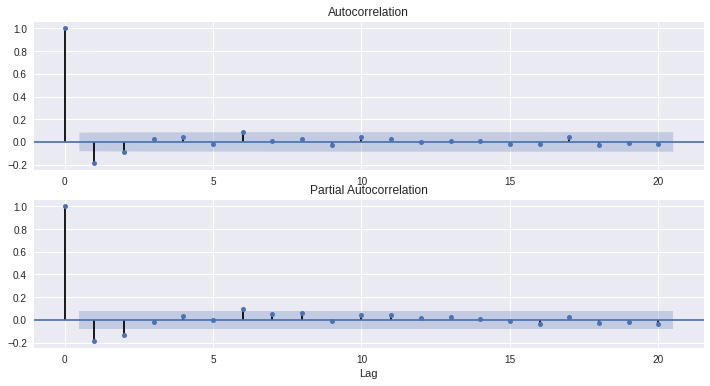

--------------------------------------------------
With fund flow in Financials Industry & ETF Type:


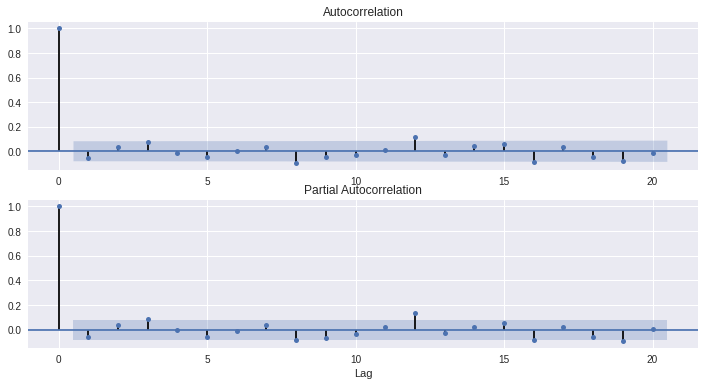

--------------------------------------------------
With fund flow in Health Care/Biotech Industry & ETF Type:


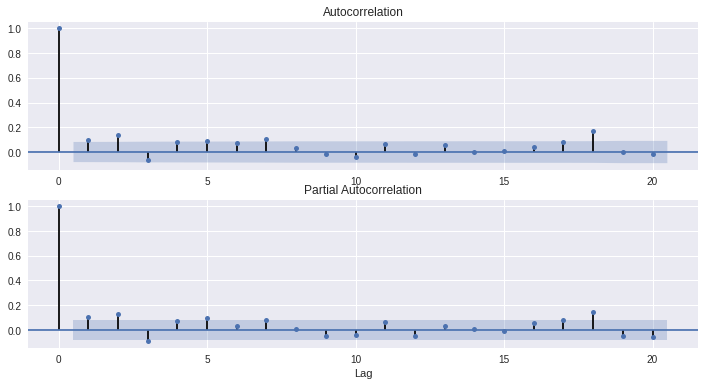

--------------------------------------------------
With fund flow in Large Cap Blend Industry & ETF Type:


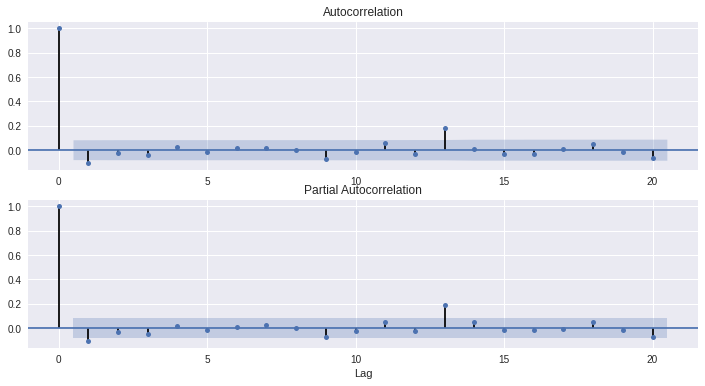

--------------------------------------------------
With fund flow in Large Cap Growth Industry & ETF Type:


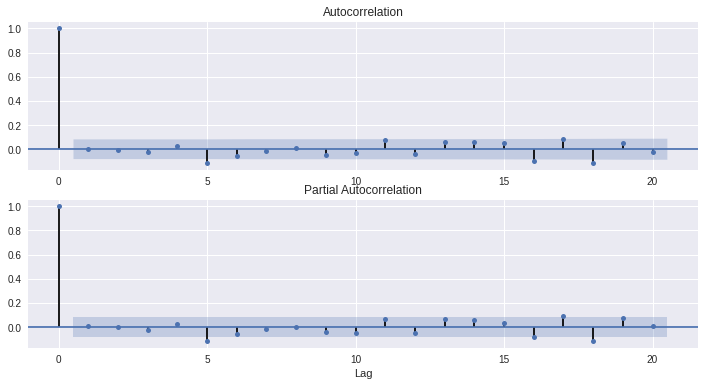

--------------------------------------------------
With fund flow in Large Cap Value Industry & ETF Type:


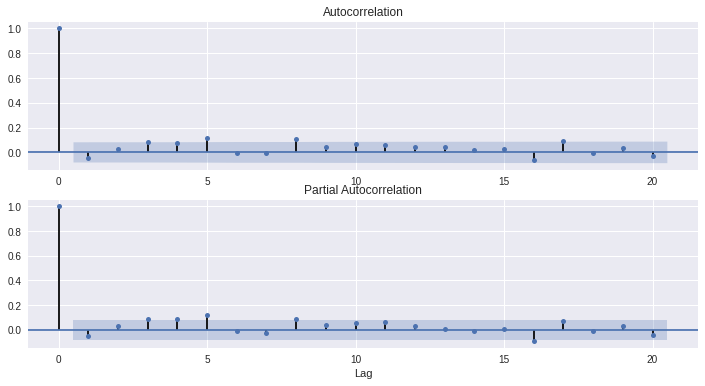

--------------------------------------------------
With fund flow in Mid Cap Blend Industry & ETF Type:


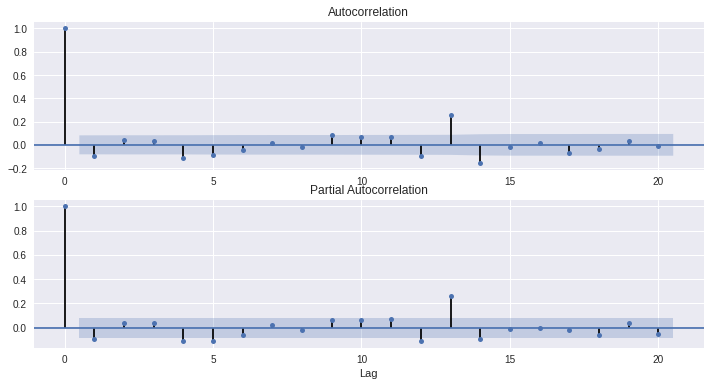

--------------------------------------------------
With fund flow in Mid Cap Growth Industry & ETF Type:


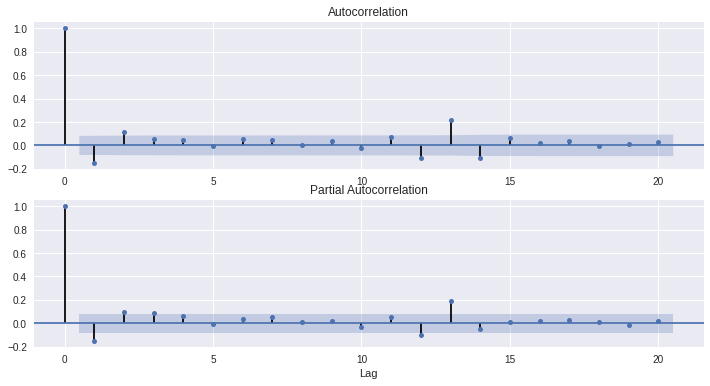

--------------------------------------------------
With fund flow in Mid Cap Value Industry & ETF Type:


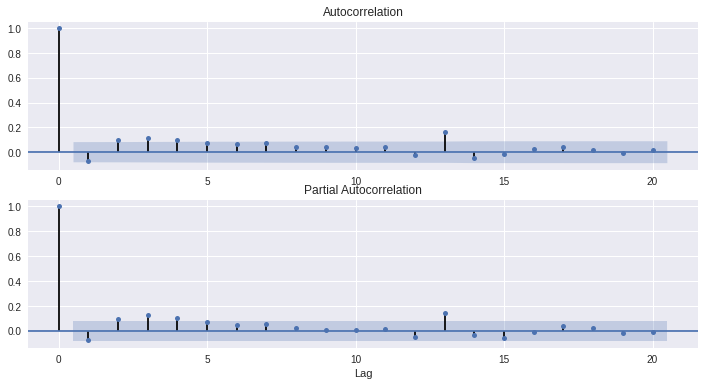

--------------------------------------------------
With fund flow in Real Estate Industry & ETF Type:


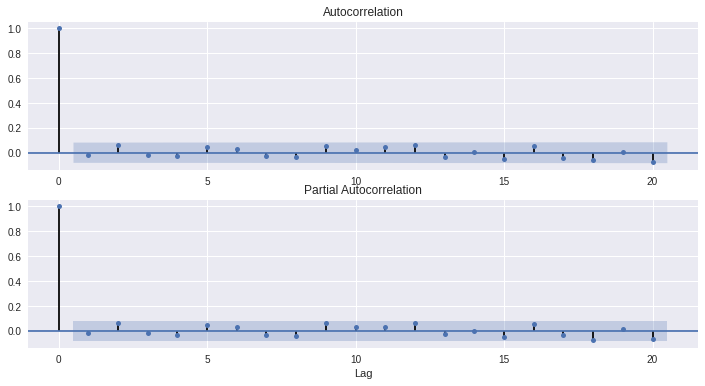

--------------------------------------------------
With fund flow in Small Cap Blend Industry & ETF Type:


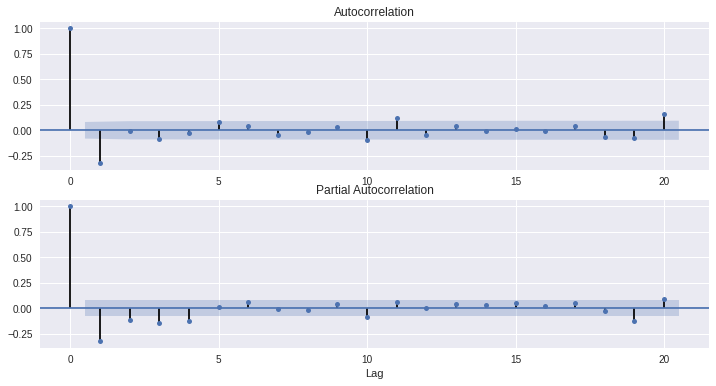

--------------------------------------------------
With fund flow in Small Cap Growth Industry & ETF Type:


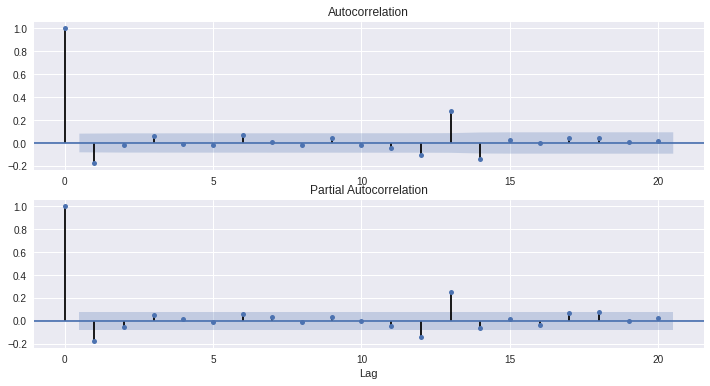

--------------------------------------------------
With fund flow in Small Cap Value Industry & ETF Type:


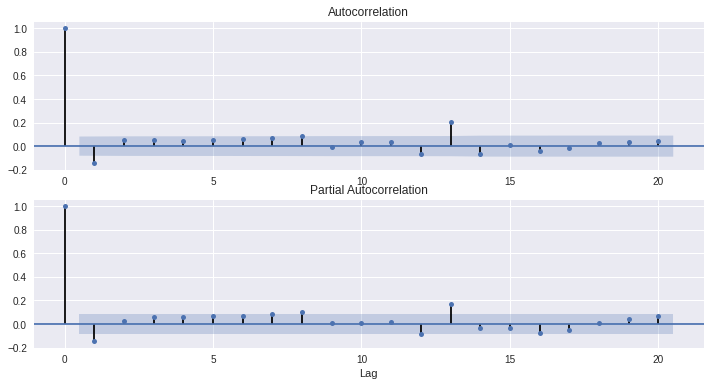

--------------------------------------------------
With fund flow in Technology Industry & ETF Type:


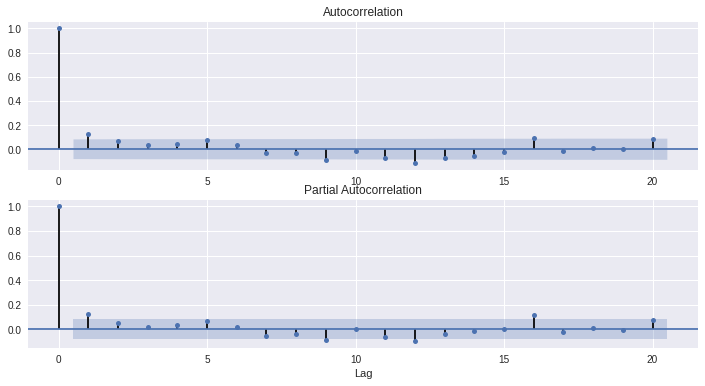

--------------------------------------------------
With fund flow in Telecom Industry & ETF Type:


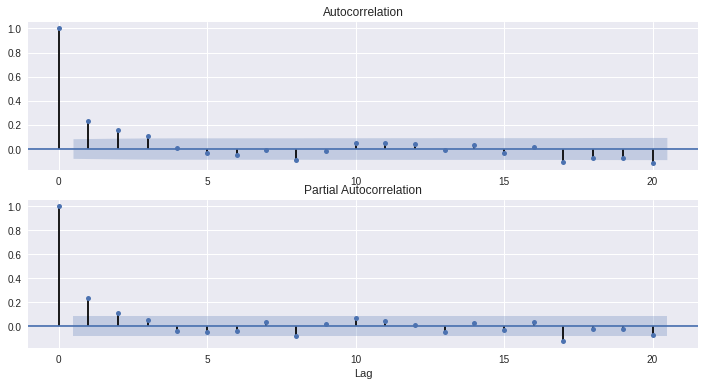

--------------------------------------------------
With fund flow in Utilities Industry & ETF Type:


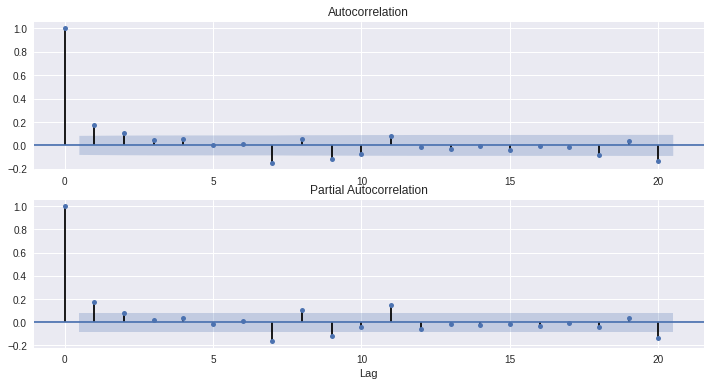

--------------------------------------------------
With fund flow in Energy Industry & IMF Type:


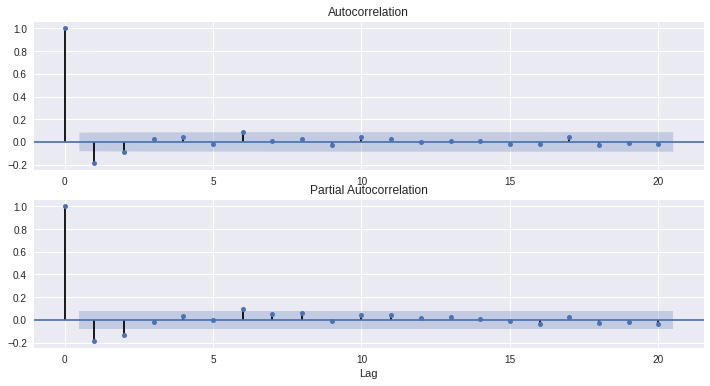

--------------------------------------------------
With fund flow in Financials Industry & IMF Type:


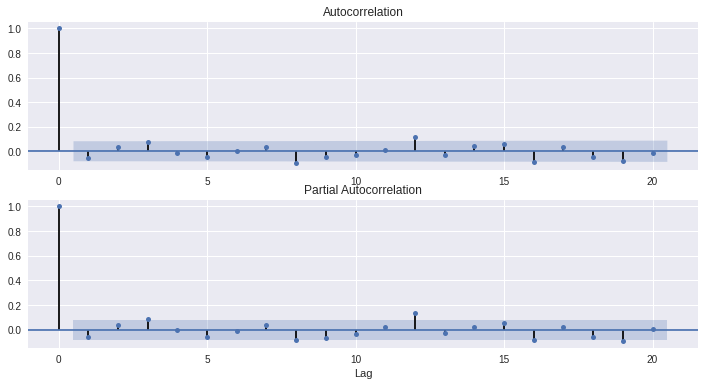

--------------------------------------------------
With fund flow in Health Care/Biotech Industry & IMF Type:


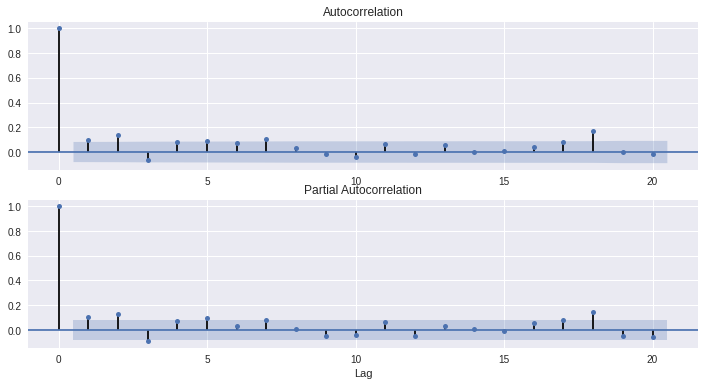

--------------------------------------------------
With fund flow in Large Cap Blend Industry & IMF Type:


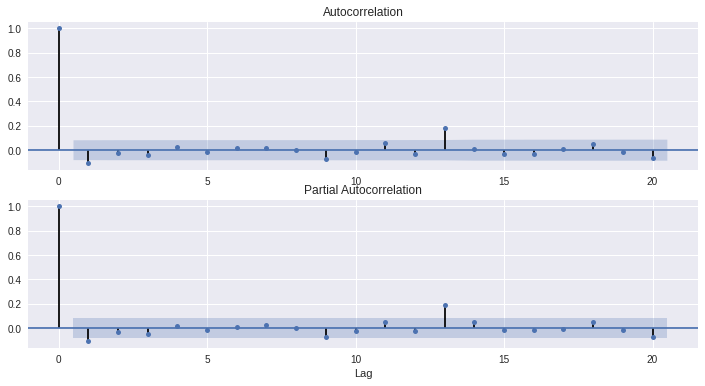

--------------------------------------------------
With fund flow in Large Cap Growth Industry & IMF Type:


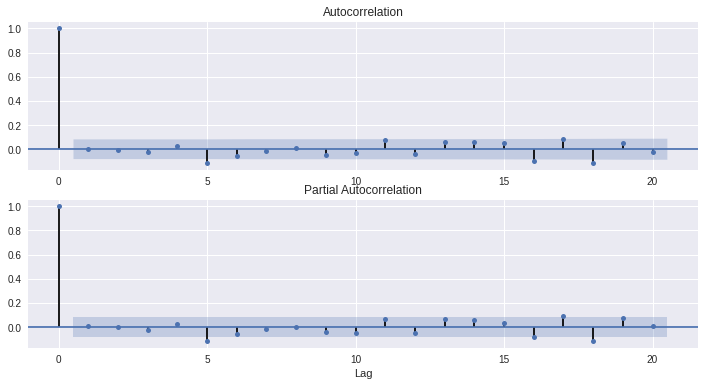

--------------------------------------------------
With fund flow in Large Cap Value Industry & IMF Type:


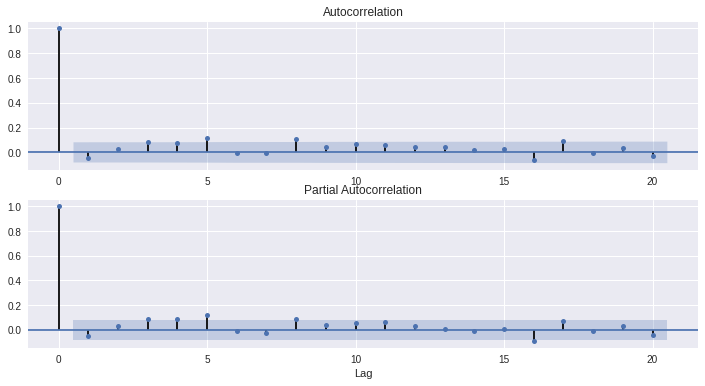

--------------------------------------------------
With fund flow in Mid Cap Blend Industry & IMF Type:


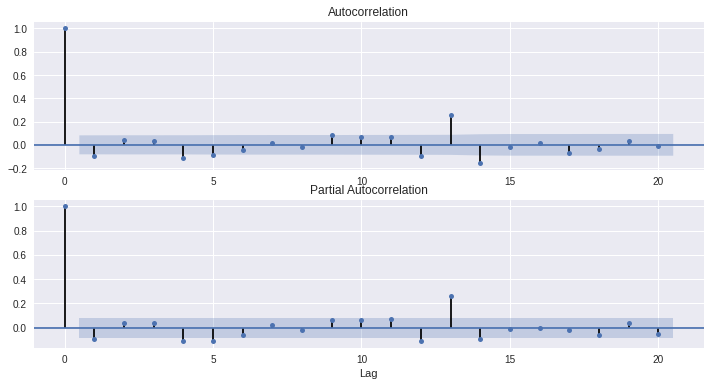

--------------------------------------------------
With fund flow in Mid Cap Growth Industry & IMF Type:


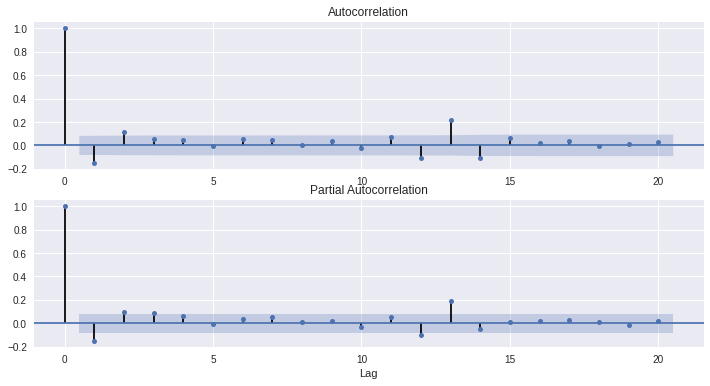

--------------------------------------------------
With fund flow in Mid Cap Value Industry & IMF Type:


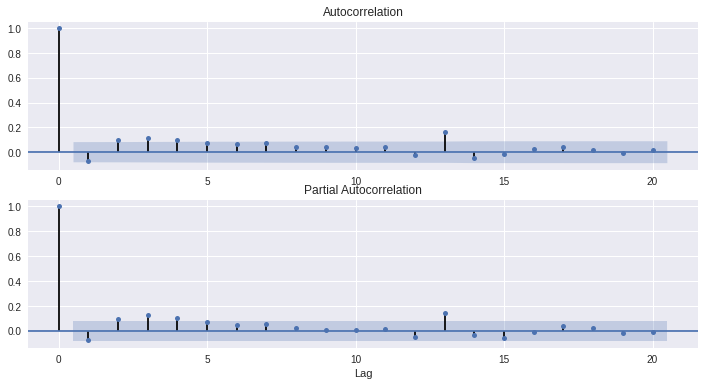

--------------------------------------------------
With fund flow in Real Estate Industry & IMF Type:


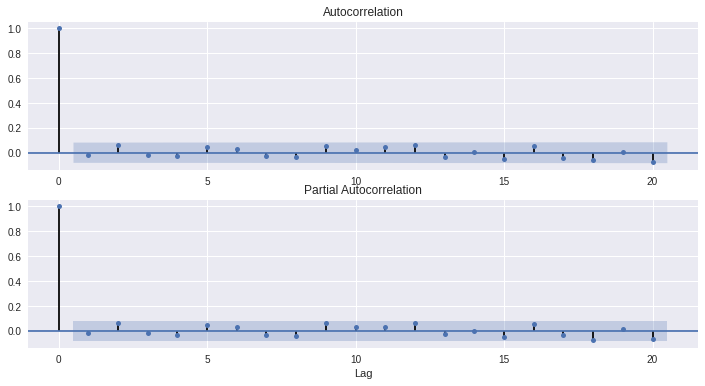

--------------------------------------------------
With fund flow in Small Cap Blend Industry & IMF Type:


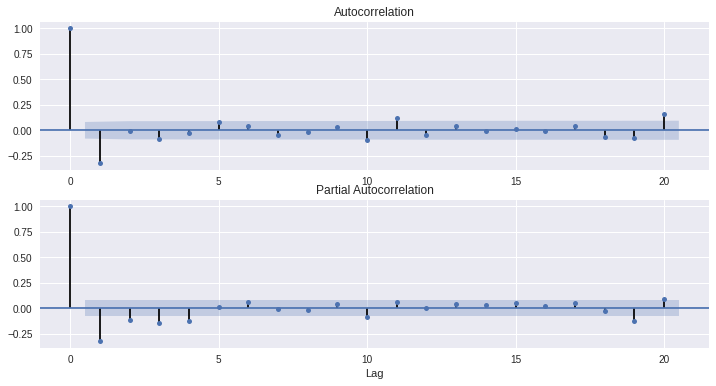

--------------------------------------------------
With fund flow in Small Cap Growth Industry & IMF Type:


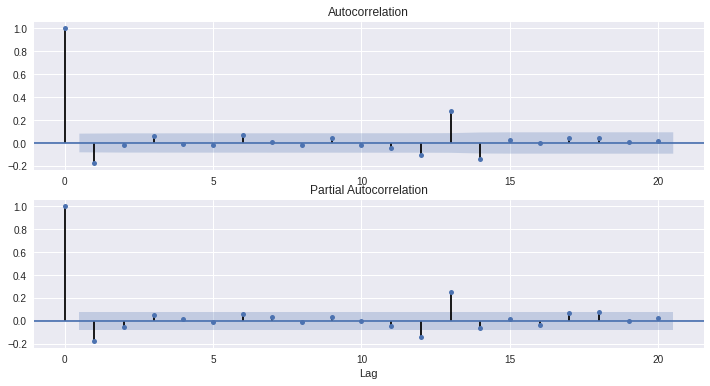

--------------------------------------------------
With fund flow in Small Cap Value Industry & IMF Type:


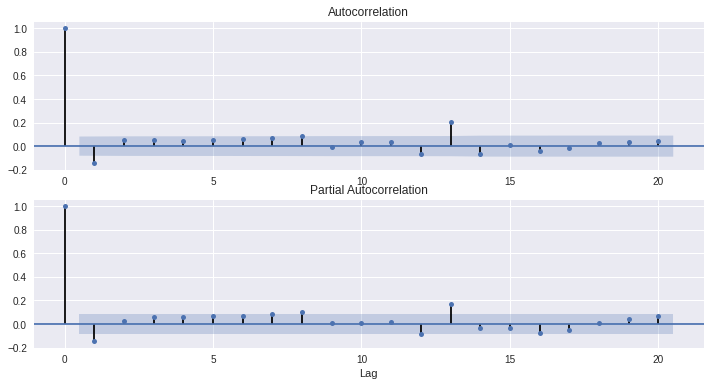

--------------------------------------------------
With fund flow in Technology Industry & IMF Type:


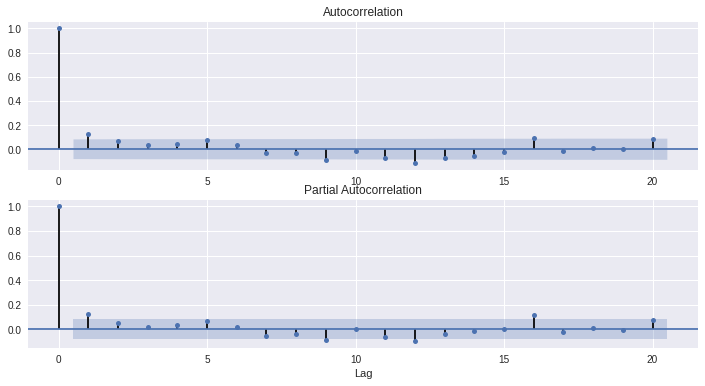

--------------------------------------------------
With fund flow in Telecom Industry & IMF Type:


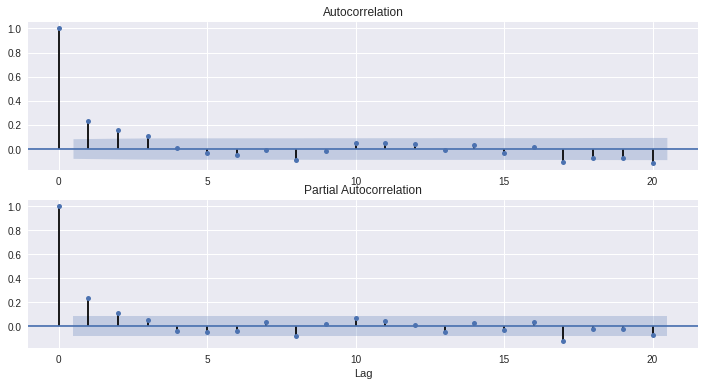

--------------------------------------------------
With fund flow in Utilities Industry & IMF Type:


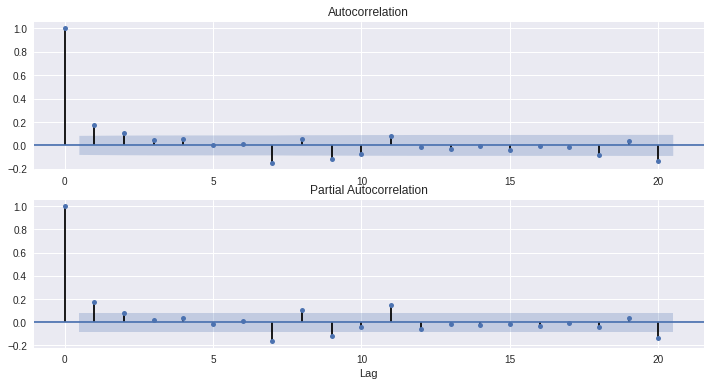

--------------------------------------------------
With fund flow in Energy Industry & RMF Type:


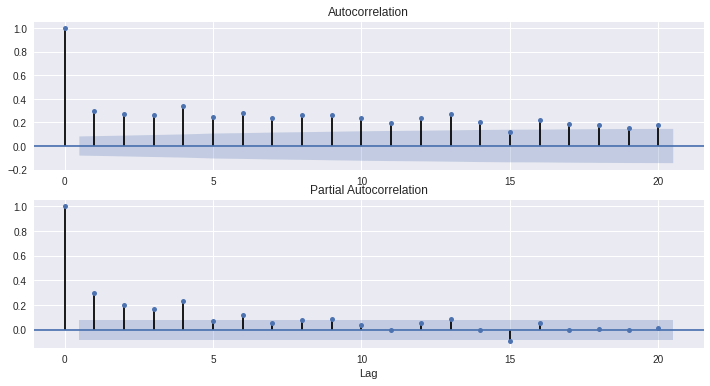

--------------------------------------------------
With fund flow in Financials Industry & RMF Type:


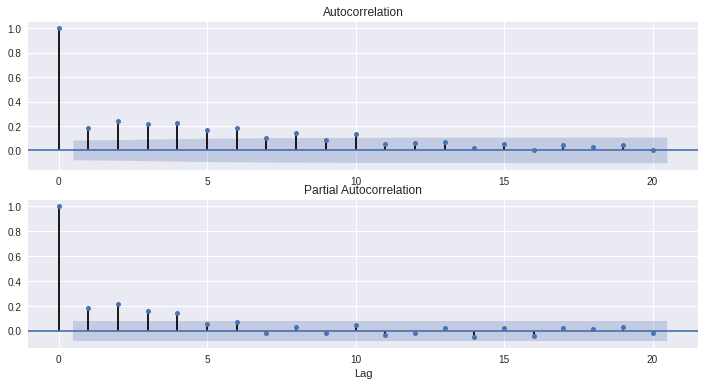

--------------------------------------------------
With fund flow in Health Care/Biotech Industry & RMF Type:


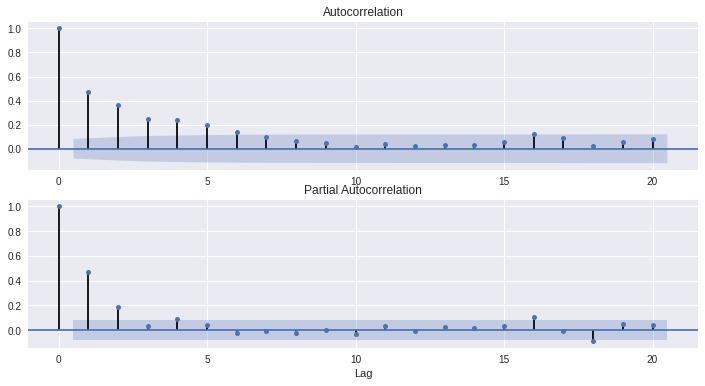

--------------------------------------------------
With fund flow in Large Cap Blend Industry & RMF Type:


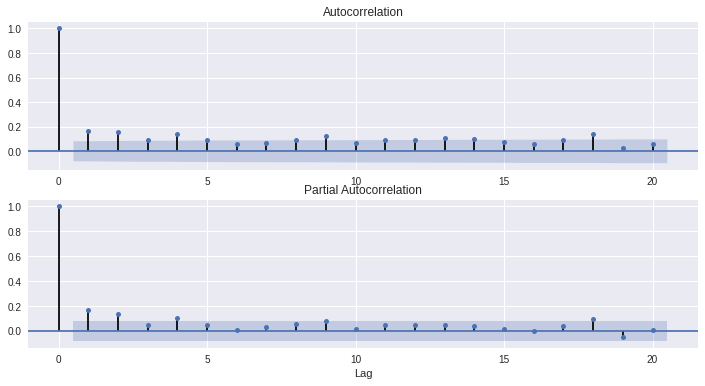

--------------------------------------------------
With fund flow in Large Cap Growth Industry & RMF Type:


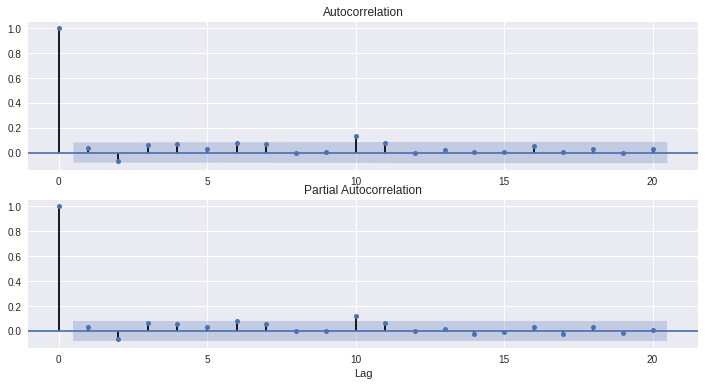

--------------------------------------------------
With fund flow in Large Cap Value Industry & RMF Type:


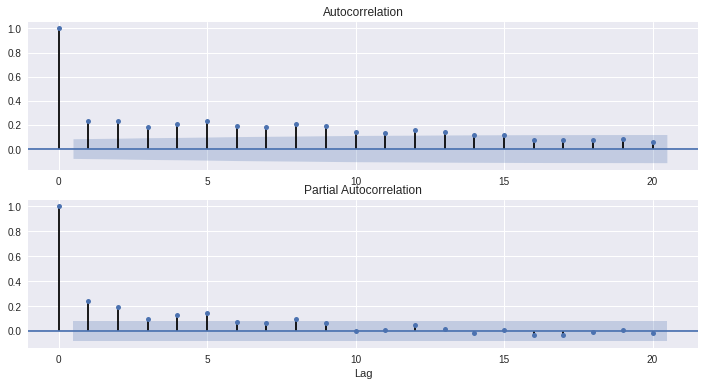

--------------------------------------------------
With fund flow in Mid Cap Blend Industry & RMF Type:


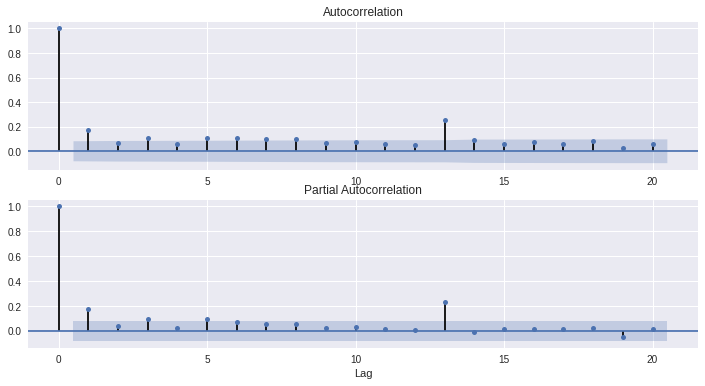

--------------------------------------------------
With fund flow in Mid Cap Growth Industry & RMF Type:


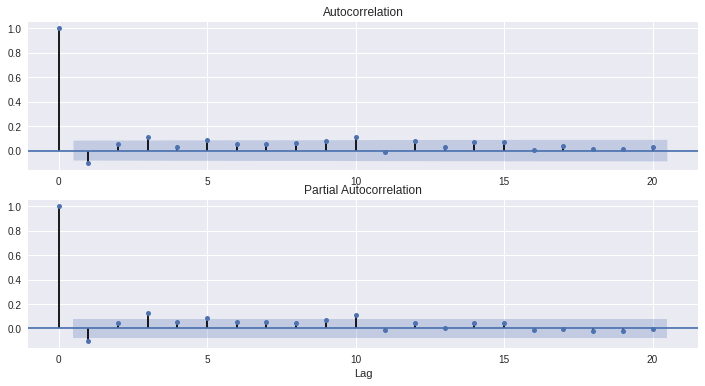

--------------------------------------------------
With fund flow in Mid Cap Value Industry & RMF Type:


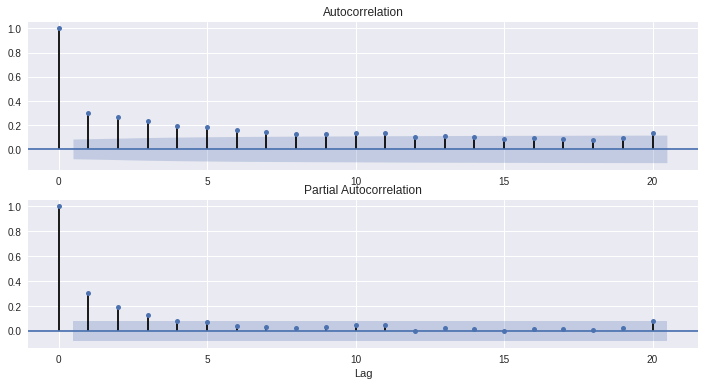

--------------------------------------------------
With fund flow in Real Estate Industry & RMF Type:


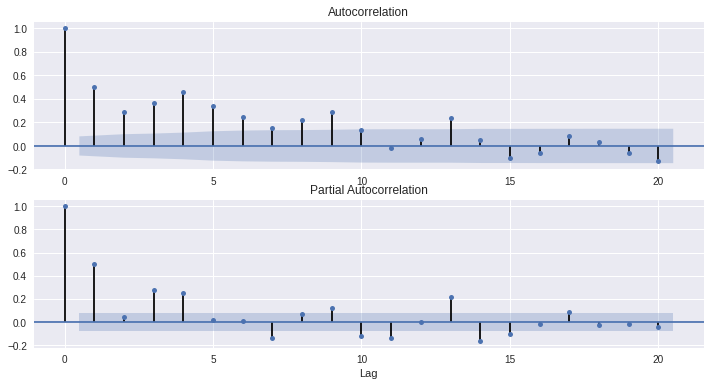

--------------------------------------------------
With fund flow in Small Cap Blend Industry & RMF Type:


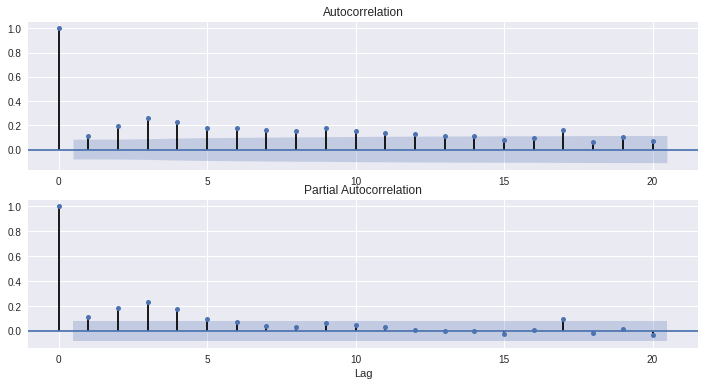

--------------------------------------------------
With fund flow in Small Cap Growth Industry & RMF Type:


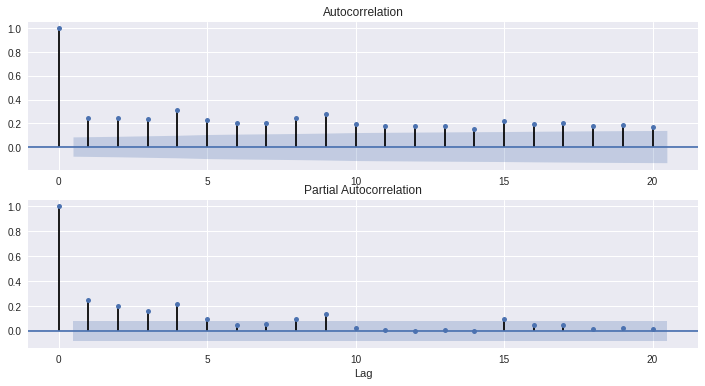

--------------------------------------------------
With fund flow in Small Cap Value Industry & RMF Type:


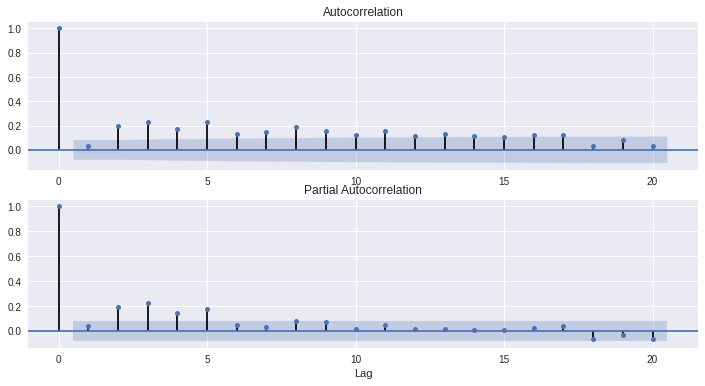

--------------------------------------------------
With fund flow in Technology Industry & RMF Type:


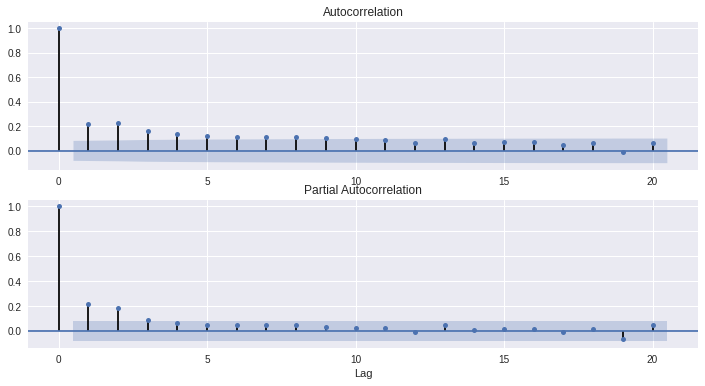

--------------------------------------------------
With fund flow in Telecom Industry & RMF Type:


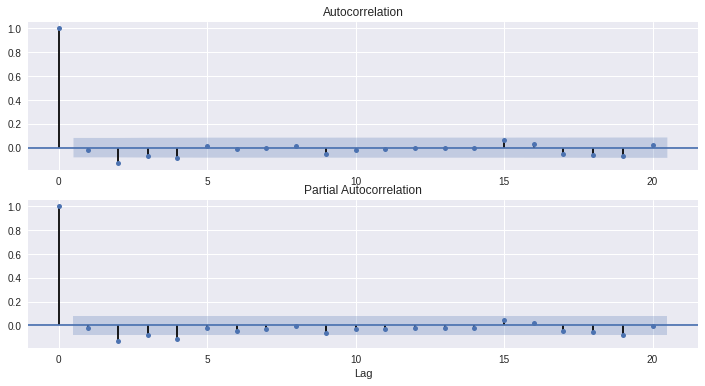

--------------------------------------------------
With fund flow in Utilities Industry & RMF Type:


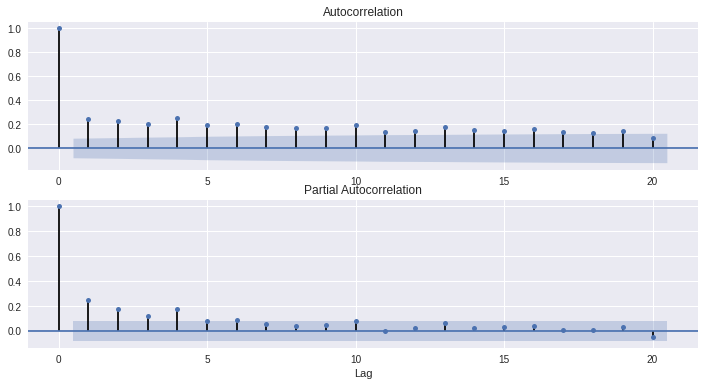

--------------------------------------------------


In [74]:
# acf & pacf plot  

# iterating for 3 types
for t in data.Type.unique():
  # iterating for 16 industries 
  for i in industries:
    print('With fund flow in {} Industry & {} Type:'.format(i, t))
    sub = data.loc[(data.Type == t) & (data.Industry == i)][['ReportDate', 'Flow']]
    fig, ax = plt.subplots(2, figsize=(12,6))
    ax[0] = plot_acf(sub.Flow, ax=ax[0], lags=20)
    ax[1] = plot_pacf(sub.Flow, ax=ax[1], lags=20)
    plt.xlabel('Lag')
    plt.show()
    print('-'*50)

### ARMA order

In [75]:
df_arma = pd.DataFrame()

In [76]:
# iterating for 3 types
for t in data.Type.unique():
  # iterating for 16 industries 
  for i in industries:
    # subset
    sub = data.loc[(data.Type == t) & (data.Industry == i)][['ReportDate', 'Flow']]

    # train & test split
    train = sub.Flow[:551]
    test = sub.Flow[550:]
    # ar param
    for p in range(4):
      # ma param
      for q in range(1, 4):
        # in case model order not applicable
        try:
          # initialize model
          model = ARMA(train, order = (p, q))
          # fit
          model_fit = model.fit()
          # model performance = aic + bic, the smaller the better
          res = model_fit.aic + model_fit.bic

          df_arma = df_arma.append({'Type': t,
                                'Industry': i,
                                'order': (p, q),
                                'performance': res}, ignore_index = True)
        except:
          continue
        # print('With window = {}, the corresponding mse in {} Industry with {} Type is {}.'.format(n, i, t, mse))

In [77]:
# groupby mse values by Type and Industries, and sort values by mse
df_arma = df_arma.groupby(['Type','Industry']).apply(lambda x: x.sort_values(["performance"], ascending = True)).reset_index(drop=True)

In [78]:
df_arma

,Type,Industry,order,performance
0,ETF,Energy,"(0, 1)",16550.632041
1,ETF,Energy,"(2, 2)",16553.528946
2,ETF,Energy,"(0, 2)",16555.240902
3,ETF,Energy,"(1, 1)",16556.755715
4,ETF,Energy,"(0, 3)",16558.160742
...,...,...,...,...
438,RMF,Utilities,"(3, 2)",11114.969816
439,RMF,Utilities,"(3, 3)",11122.311148
440,RMF,Utilities,"(0, 3)",11194.915171
441,RMF,Utilities,"(0, 2)",11196.350301


In [79]:
# store best result
df_arma_final = pd.DataFrame()

In [80]:
# iterating for 3 types
for t in data.Type.unique():
  # iterating for 16 industries 
  for i in industries:
    # subset
    best = df_arma.loc[(df_arma.Type == t) & (df_arma.Industry == i)].iloc[0]
    df_arma_final = df_arma_final.append(best)

In [81]:
df_arma_final

,Type,Industry,order,performance
0,ETF,Energy,"(0, 1)",16550.632041
11,ETF,Financials,"(3, 2)",17244.091640
19,ETF,Health Care/Biotech,"(1, 2)",15711.986010
28,ETF,Large Cap Blend,"(0, 1)",21365.890938
36,ETF,Large Cap Growth,"(2, 1)",17625.097701
43,ETF,Large Cap Value,"(2, 1)",16794.606375
50,ETF,Mid Cap Blend,"(2, 2)",17088.323170
58,ETF,Mid Cap Growth,"(2, 1)",13058.888455
67,ETF,Mid Cap Value,"(2, 1)",14104.082401
73,ETF,Real Estate,"(0, 1)",15683.259062


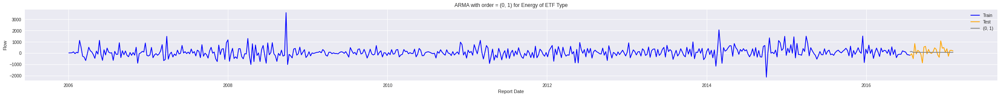

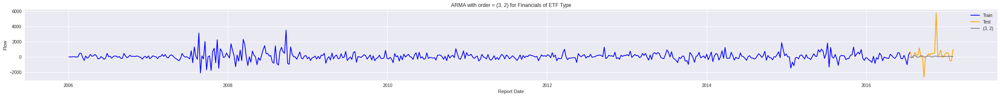

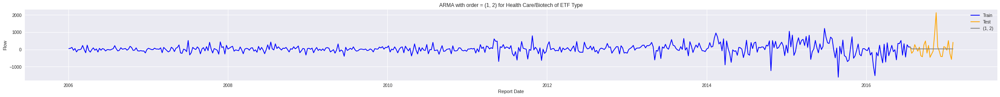

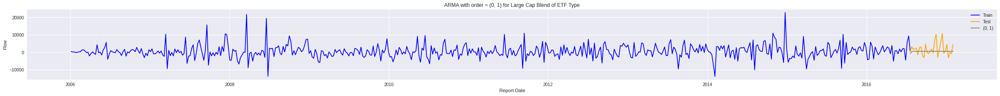

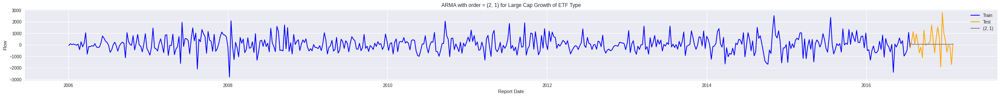

...

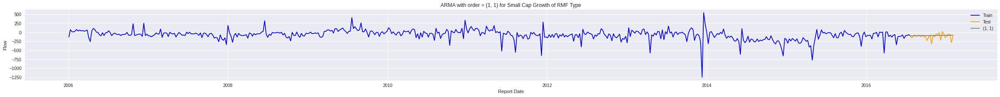

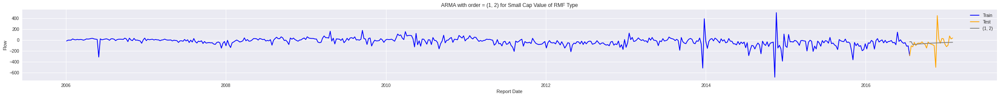

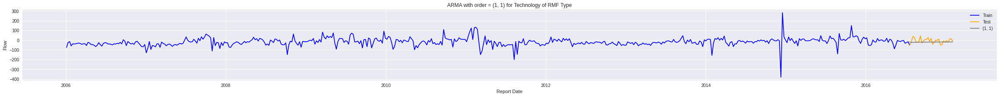

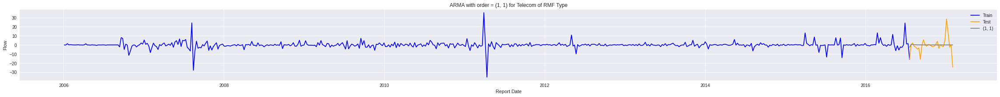

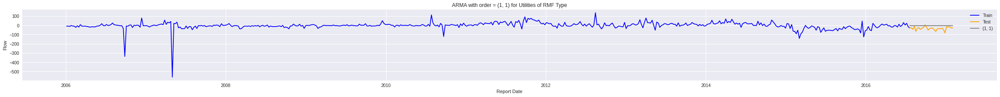

In [84]:
# visualizing
for row in range(df_arma_final.shape[0]):
  # extract column factors
  industry = df_arma_final.iloc[row].Industry
  ftype = df_arma_final.iloc[row].Type
  order = df_arma_final.iloc[row].order

  # subset data
  sub = data.loc[(data.Type == ftype) & (data.Industry == industry)][['ReportDate', 'Flow']]
  # reorder sequence
  sub.sort_values('ReportDate', ascending  = True, inplace=True)
  
  # train & test split
  train = sub[:551]
  test = sub[550:]

  # initialize 
  model = ARMA(train.Flow, order = order)
  # fit
  try:
    model_fit = model.fit()
    # predict
    predict = model_fit.predict(start = 550, end = 578)

    # plot
    plt.figure(figsize= (40, 3))
    plt.plot(train.ReportDate, train.Flow, c = 'b', label = 'Train')
    plt.plot(test.ReportDate, test.Flow, c='orange', label = 'Test')
    plt.plot(test.ReportDate, predict, c='grey', label = order)
    plt.title('ARMA with order = {} for {} of {} Type'.format(order, industry, ftype))
    plt.xlabel('Report Date')
    plt.ylabel('Flow')
    plt.legend()
    plt.show()

  except:
    continue

## LSTM Estimatioms

# Multi-Class Classification 
